In [1]:
%matplotlib inline
%load_ext autoreload
%autoreload 2

In [2]:
import itertools
import logging
import os
import pickle
import pprint
from glob import glob
os.chdir(os.path.expandvars('$HOME/sleep-staging'))

import matplotlib as mpl
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
# import phate
# import scprep
import seaborn as sns
import umap.plot
from umap import UMAP
from cuml.manifold.umap import UMAP as cuUMAP
from h5py import File

sns.set(context='paper', rc={'figure.figsize':(14,10)})

HYP_DICT = {0: 'W', 1: 'N1', 2: 'N2', 3: 'N3', 4: 'R'}

logging.basicConfig(format='%(asctime)s %(levelname)s | %(message)s', level=logging.INFO, datefmt='%I:%M:%S')
logger = logging.getLogger()

/home/neergaard/miniconda3/envs/rapids-0.17/lib/python3.7/site-packages/umap/__init__.py:9: UserWarning: Tensorflow not installed; ParametricUMAP will be unavailable
  warn("Tensorflow not installed; ParametricUMAP will be unavailable")


In [3]:
from compress_pickle import dump, load

ModuleNotFoundError: No module named 'compress_pickle'

In [3]:
df = pd.read_csv('overview_file_cohortsEM-ling1.csv')
display(df.head())

,Index,ID,ID-ling,Cohort,Diagnosis,Label,Sleep scoring training data,Sleep scoring test data,Narcolepsy training data,Narcolepsy test data,Replication data,High pre-test,CSF hypocretin-1,DQ0602,Added by Alex
0,NaN,SSC_NARCO_1508_1,1508,SSC,'T1 NARCOLEPSY',1,0,1,1,0,0,1,na,1,1
1,NaN,SSC_NARCO_1534_1,1534,SSC,'T1 NARCOLEPSY',1,0,1,1,0,0,1,na,1,1
2,NaN,SSC_NARCO_1538_1,1538,SSC,'T1 NARCOLEPSY',1,0,1,0,1,0,1,na,1,1
3,NaN,SSC_NARCO_1647_1,1647,SSC,'T1 NARCOLEPSY',1,0,1,1,0,0,1,na,1,1
4,1267.0,SSC_1958_1,1958,SSC,'T1 NARCOLEPSY',1,0,1,1,0,0,1,0,0,0


In [4]:
available_predictions = glob("experiments/**/SSC-WSC_test_predictions.pkl", recursive=True)
pprint.pprint(available_predictions)

['experiments/massc/avg_kw21/20201126_043826/SSC-WSC_test_predictions.pkl',
 'experiments/massc/avg_kw21_rnn128/20201209_025443/SSC-WSC_test_predictions.pkl',
 'experiments/massc/att30/20201124_080609/SSC-WSC_test_predictions.pkl',
 'experiments/massc/avg_kw21_rnn128_cyclic/20201212_150902/SSC-WSC_test_predictions.pkl']


In [5]:
selected_experiment = 'experiments/massc/avg_kw21/20201126_043826/SSC-WSC_test_predictions.pkl'
with open(selected_experiment, 'rb') as f:
    predictions = pickle.load(f)
list_studies = list(predictions.keys())
df_preds = pd.read_csv(os.path.join(os.path.dirname(selected_experiment), 'SSC-WSC_test_results.csv'), index_col=0)
df_preds = pd.merge(left=df_preds, right=df[['ID', 'Diagnosis', 'Label']], how='left', right_on='ID', left_on='SubjectID')
display(df_preds.query('Label == 0').sort_values('Balanced accuracy', ascending=False))
print(f"Unique classes: {df_preds['Diagnosis'].unique()}")
print(f"Window unique classes: {df_preds['Window'].unique()}")
print(f"Case unique classes: {df_preds['Case'].unique()}")
display(df_preds.query('Label == 1'))

,FileID,SubjectID,Window,Case,Accuracy,Balanced accuracy,Kappa,F1,Precision,Recall,...,Precision - N3,Recall - N3,Support - N3,F1 - REM,Precision - REM,Recall - REM,Support - REM,ID,Diagnosis,Label
52,A1038_4 172720.h5,A1038_4 172720,1 s,all,0.849057,0.894873,0.795451,0.830931,0.806470,0.894873,...,0.548148,0.986667,75.0,0.985782,0.971963,1.000000,104.0,A1038_4 172720,'NON-NARCOLEPSY CONTROL',0
508,SSC_6856_1.h5,SSC_6856_1,1 s,all,0.876377,0.892037,0.811801,0.784684,0.733296,0.892037,...,0.480519,1.000000,37.0,0.880000,0.785714,1.000000,33.0,SSC_6856_1,'NON-NARCOLEPSY CONTROL',0
150,C1040_4 181859.h5,C1040_4 181859,1 s,all,0.883333,0.888253,0.817163,0.776490,0.769768,0.888253,...,0.842593,0.900990,101.0,0.973294,0.959064,0.987952,166.0,C1040_4 181859,'NON-NARCOLEPSY CONTROL',0
507,SSC_6854_1.h5,SSC_6854_1,1 s,all,0.831891,0.884168,0.776560,0.818131,0.812352,0.884168,...,0.847134,1.000000,133.0,0.921348,0.901099,0.942529,87.0,SSC_6854_1,'NON-NARCOLEPSY CONTROL',0
220,C9145_2 172540.h5,C9145_2 172540,1 s,all,0.840263,0.883908,0.773819,0.750679,0.725847,0.883908,...,0.407407,1.000000,55.0,0.945736,0.978610,0.915000,200.0,C9145_2 172540,'NON-NARCOLEPSY CONTROL',0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
396,SSC_5280_1.h5,SSC_5280_1,1 s,all,0.474593,0.530022,0.314027,0.395287,0.529237,0.530022,...,0.940476,0.763285,207.0,0.145631,0.078534,1.000000,15.0,SSC_5280_1,'NON-NARCOLEPSY CONTROL',0
514,SSC_6927_1.h5,SSC_6927_1,1 s,all,0.745384,0.509478,0.571534,0.427622,0.547962,0.407582,...,0.000000,0.000000,0.0,0.907104,0.861592,0.957692,260.0,SSC_6927_1,'NON-NARCOLEPSY CONTROL',0
120,C0605_4 173848.h5,C0605_4 173848,1 s,all,0.544211,0.508400,0.353138,0.490093,0.615286,0.508400,...,0.000000,0.000000,0.0,0.500000,0.774194,0.369231,65.0,C0605_4 173848,'NON-NARCOLEPSY CONTROL',0
411,SSC_5458_1.h5,SSC_5458_1,1 s,all,0.581797,0.489882,0.341106,0.294390,0.314674,0.293929,...,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.0,SSC_5458_1,'NON-NARCOLEPSY CONTROL',0


Unique classes: ["'NON-NARCOLEPSY CONTROL'" "'T1 NARCOLEPSY'" "'OTHER HYPERSOMNIA'"]
Window unique classes: ['1 s']
Case unique classes: ['all']


,FileID,SubjectID,Window,Case,Accuracy,Balanced accuracy,Kappa,F1,Precision,Recall,...,Precision - N3,Recall - N3,Support - N3,F1 - REM,Precision - REM,Recall - REM,Support - REM,ID,Diagnosis,Label
299,SSC_1958_1.h5,SSC_1958_1,1 s,all,0.656039,0.700787,0.480362,0.477659,0.486116,0.700787,...,0.292453,0.756098,41.0,0.470588,0.307692,1.000000,16.0,SSC_1958_1,'T1 NARCOLEPSY',1
300,SSC_2605_1.h5,SSC_2605_1,1 s,all,0.681190,0.622985,0.568261,0.466644,0.542127,0.622985,...,0.843836,0.950617,324.0,0.023810,0.012048,1.000000,1.0,SSC_2605_1,'T1 NARCOLEPSY',1
306,SSC_4723_1.h5,SSC_4723_1,1 s,all,0.662694,0.680094,0.549286,0.599497,0.615273,0.680094,...,0.994536,0.719368,253.0,0.896175,0.828283,0.976190,168.0,SSC_4723_1,'T1 NARCOLEPSY',1
315,SSC_4813_1.h5,SSC_4813_1,1 s,all,0.735939,0.597847,0.644742,0.610992,0.633843,0.597847,...,0.000000,0.000000,5.0,0.859756,0.933775,0.796610,177.0,SSC_4813_1,'T1 NARCOLEPSY',1
355,SSC_5139_1.h5,SSC_5139_1,1 s,all,0.649302,0.714275,0.498503,0.585201,0.617166,0.714275,...,0.447619,0.921569,51.0,0.836449,0.736626,0.967568,185.0,SSC_5139_1,'T1 NARCOLEPSY',1
397,SSC_5335_1.h5,SSC_5335_1,1 s,all,0.752821,0.768032,0.678440,0.734077,0.737968,0.768032,...,0.795181,0.985075,134.0,0.759322,0.666667,0.881890,127.0,SSC_5335_1,'T1 NARCOLEPSY',1
499,SSC_6542_1.h5,SSC_6542_1,1 s,all,0.821542,0.879353,0.745264,0.708109,0.721268,0.879353,...,0.920863,0.955224,134.0,0.883168,0.854406,0.913934,244.0,SSC_6542_1,'T1 NARCOLEPSY',1


In [6]:
top10_controls = df_preds[
    (df_preds['Label'] == 0)
    & (df_preds['Support - W'] > 20) 
    & (df_preds['Support - N1'] > 20) 
    & (df_preds['Support - N2'] > 20) 
    & (df_preds['Support - N3'] > 20) 
    & (df_preds["Support - REM"] > 20)
].sort_values(["Accuracy"], ascending=False).head(10).reset_index(drop=True)
display(top10_controls)

,FileID,SubjectID,Window,Case,Accuracy,Balanced accuracy,Kappa,F1,Precision,Recall,...,Precision - N3,Recall - N3,Support - N3,F1 - REM,Precision - REM,Recall - REM,Support - REM,ID,Diagnosis,Label
0,C1584_3 172654.h5,C1584_3 172654,1 s,all,0.912027,0.815213,0.865526,0.784308,0.761220,0.815213,...,0.485714,0.586207,29.0,0.896175,0.872340,0.921348,89.0,C1584_3 172654,'NON-NARCOLEPSY CONTROL',0
1,A2202_3 171828.h5,A2202_3 171828,1 s,all,0.908976,0.836763,0.793684,0.777232,0.766219,0.836763,...,0.705128,1.000000,55.0,0.805970,0.692308,0.964286,28.0,A2202_3 171828,'NON-NARCOLEPSY CONTROL',0
2,A0147_6 165655.h5,A0147_6 165655,1 s,all,0.900966,0.871082,0.842300,0.800551,0.769639,0.871082,...,0.597015,0.851064,47.0,0.938462,0.945736,0.931298,131.0,A0147_6 165655,'NON-NARCOLEPSY CONTROL',0
3,SSC_5547_1.h5,SSC_5547_1,1 s,all,0.899548,0.877883,0.848494,0.850218,0.828665,0.877883,...,0.808383,0.957447,141.0,0.951220,0.917647,0.987342,158.0,SSC_5547_1,'NON-NARCOLEPSY CONTROL',0
4,N4499_2 092211.h5,N4499_2 092211,1 s,all,0.890519,0.819924,0.828192,0.785691,0.766977,0.819924,...,0.702381,0.855072,69.0,0.953930,0.926316,0.983240,179.0,N4499_2 092211,'NON-NARCOLEPSY CONTROL',0
5,A0531_6 175138.h5,A0531_6 175138,1 s,all,0.888331,0.871765,0.843528,0.832315,0.819650,0.871765,...,0.758065,0.824561,57.0,0.928910,0.980000,0.882883,111.0,A0531_6 175138,'NON-NARCOLEPSY CONTROL',0
6,C2209_4 233629.h5,C2209_4 233629,1 s,all,0.888122,0.854197,0.844454,0.833848,0.834242,0.854197,...,0.915254,0.739726,73.0,0.960396,0.960396,0.960396,101.0,C2209_4 233629,'NON-NARCOLEPSY CONTROL',0
7,A1558_4 172739.h5,A1558_4 172739,1 s,all,0.885822,0.711440,0.728961,0.716749,0.761310,0.711440,...,0.727273,0.355556,45.0,0.859259,0.816901,0.906250,64.0,A1558_4 172739,'NON-NARCOLEPSY CONTROL',0
8,C1146_4 182423.h5,C1146_4 182423,1 s,all,0.882547,0.859681,0.821311,0.809713,0.802139,0.859681,...,0.951923,0.811475,122.0,0.893333,0.837500,0.957143,70.0,C1146_4 182423,'NON-NARCOLEPSY CONTROL',0
9,C9188_4 135030.h5,C9188_4 135030,1 s,all,0.881230,0.844254,0.838379,0.792624,0.793171,0.844254,...,0.957317,0.882022,178.0,0.933610,0.925926,0.941423,239.0,C9188_4 135030,'NON-NARCOLEPSY CONTROL',0


In [7]:
narcs = df_preds[
    (df_preds['Label'] == 1)
].sort_values(["Accuracy"], ascending=False).reset_index(drop=True)
display(narcs)

,FileID,SubjectID,Window,Case,Accuracy,Balanced accuracy,Kappa,F1,Precision,Recall,...,Precision - N3,Recall - N3,Support - N3,F1 - REM,Precision - REM,Recall - REM,Support - REM,ID,Diagnosis,Label
0,SSC_6542_1.h5,SSC_6542_1,1 s,all,0.821542,0.879353,0.745264,0.708109,0.721268,0.879353,...,0.920863,0.955224,134.0,0.883168,0.854406,0.913934,244.0,SSC_6542_1,'T1 NARCOLEPSY',1
1,SSC_5335_1.h5,SSC_5335_1,1 s,all,0.752821,0.768032,0.678440,0.734077,0.737968,0.768032,...,0.795181,0.985075,134.0,0.759322,0.666667,0.881890,127.0,SSC_5335_1,'T1 NARCOLEPSY',1
2,SSC_4813_1.h5,SSC_4813_1,1 s,all,0.735939,0.597847,0.644742,0.610992,0.633843,0.597847,...,0.000000,0.000000,5.0,0.859756,0.933775,0.796610,177.0,SSC_4813_1,'T1 NARCOLEPSY',1
3,SSC_2605_1.h5,SSC_2605_1,1 s,all,0.681190,0.622985,0.568261,0.466644,0.542127,0.622985,...,0.843836,0.950617,324.0,0.023810,0.012048,1.000000,1.0,SSC_2605_1,'T1 NARCOLEPSY',1
4,SSC_4723_1.h5,SSC_4723_1,1 s,all,0.662694,0.680094,0.549286,0.599497,0.615273,0.680094,...,0.994536,0.719368,253.0,0.896175,0.828283,0.976190,168.0,SSC_4723_1,'T1 NARCOLEPSY',1
5,SSC_1958_1.h5,SSC_1958_1,1 s,all,0.656039,0.700787,0.480362,0.477659,0.486116,0.700787,...,0.292453,0.756098,41.0,0.470588,0.307692,1.000000,16.0,SSC_1958_1,'T1 NARCOLEPSY',1
6,SSC_5139_1.h5,SSC_5139_1,1 s,all,0.649302,0.714275,0.498503,0.585201,0.617166,0.714275,...,0.447619,0.921569,51.0,0.836449,0.736626,0.967568,185.0,SSC_5139_1,'T1 NARCOLEPSY',1


In [8]:
X = []
y = []
l = []
d = []
for idx, selected_record in top10_controls.iterrows():
    fileid = selected_record['FileID']
    diagnosis = selected_record['Diagnosis'].replace("'", "")
    record = predictions[fileid]
    logits = record['logits']
    target = record['true'].argmax(axis=1).repeat(30)
    labels = np.array([HYP_DICT[t] for t in target])
    labels_disease = [diagnosis for _ in range(len(target))]
    
    X.append(logits)
    y.append(target)
    l.append(labels)
    d.extend(labels_disease)
    
X = np.concatenate(X, axis=0)
y = np.concatenate(y, axis=0)
l = np.concatenate(l, axis=0)

X = np.ascontiguousarray(X, dtype=np.float32)

In [77]:
np.save('umap_data', X)

In [79]:
Xx = np.load('umap_data.npy')

In [80]:
Xx.shape

(265500, 5)

In [ ]:
n_neighbors = [32, 64, 128, 256]
min_dists = [0.25, 0.5, 0.75, 0.99]
# umap_ops = {k: v for k, v in itertools.product(n_neighbors, min_dists)}
umap_ops = {k: {v: [] for v in min_dists} for k in n_neighbors}
umap_ops
# [(k, v) for k, v in itertools.product(n_neighbors, min_dists)]

In [37]:
umap_op.embedding_.max()

26.339245

In [38]:
sum(cumap_op.embedding_ > 90)

array([42, 28])

In [70]:
(np.abs(cumap_op.embedding_) < 30).all(axis=1).sum()

263908

In [68]:
cumap_op.embedding_[:, 1].max()

99.856

07:14:07 INFO | knn=256, min_dist=0.0
07:14:07 INFO | 	Creating UMAP object
07:14:07 INFO | 	Fitting UMAP to data
07:14:30 INFO | 	Plotting embedded data
07:14:30 INFO | 	Saving figure


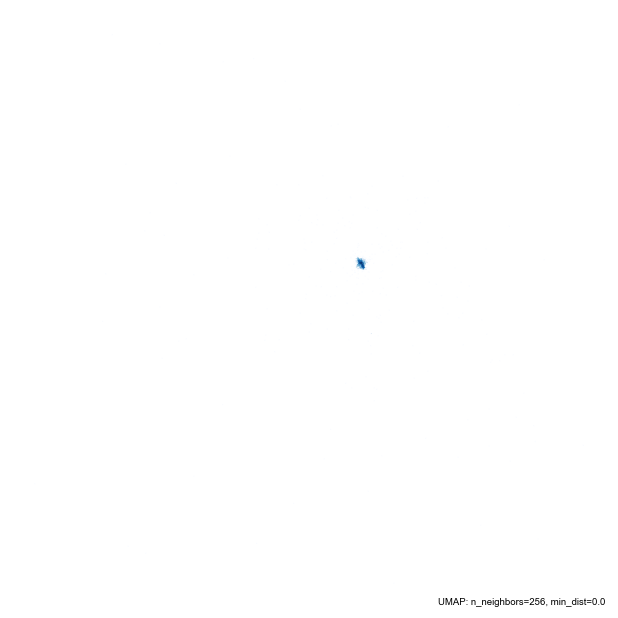

In [11]:
# Create a control-based embedding space

width = 800
height = 800
dpi = plt.rcParams["figure.dpi"]

# n_neighbors = [32, 64, 128, 256]
# min_dists = [0.25, 0.5, 0.75, 0.99]
n_neighbors = [256]
min_dists = [0.0]
cumap_ops = {k: {v: [] for v in min_dists} for k in n_neighbors}
# f, axes = plt.subplots(nrows=len(n_neighbors), ncols=len(min_dist), dpi=300)
for (nn, d) in itertools.product(n_neighbors, min_dists):
    logging.info(f'knn={nn}, min_dist={d}')
    logging.info('\tCreating UMAP object')
    cumap_op = cuUMAP(n_neighbors=nn, n_components=2, min_dist=d)
    logging.info('\tFitting UMAP to data')
    cumap_op = cumap_op.fit(X)
#     mask = (np.abs(cumap_op.embedding_) < 30).all(axis=1)
#     cumap_op.embedding_ = cumap_op.embedding_[mask]
    cumap_ops[nn][d] = cumap_op
    logging.info('\tPlotting embedded data')

    umap.plot.points(cumap_op, color_key_cmap='Paired', background='white')
#     fig = plt.figure(figsize=(width / dpi, height / dpi))
#     ax = fig.add_subplot(111)
#     ax = umap.plot._datashade_points(cumap_op.embedding_, ax=ax, labels=l[mask], color_key_cmap='Paired', background='black')
    
#     ax.set(xticks=[], yticks=[])
#     ax.text(
#         0.99,
#         0.01,
#         "UMAP: n_neighbors={}, min_dist={}".format(
#             nn, d
#         ),
#         transform=ax.transAxes,
#         horizontalalignment="right",
#         color='white',
#     )

    logging.info('\tSaving figure')
    try:
        save_path = f'results/umap/umap_knn{nn}_mindist{d}.png'
#         plt.savefig(save_path, dpi=300, bbox_inches='tight', pad_inches=0)
    except:
        save_path = f'results/umap_knn{nn}_mindist{d}.png'
#         plt.savefig(save_path, dpi=300, bbox_inches='tight', pad_inches=0)

# with open('results/umap_control_embeddings.pkl', 'wb') as f:
#     pickle.dump(umap_ops, f)

07:14:35 INFO | knn=256, min_dist=0.0
07:14:35 INFO | 	Creating UMAP object
07:14:35 INFO | 	Fitting UMAP to data
07:28:46 INFO | 	Plotting embedded data
07:28:47 INFO | 	Saving figure


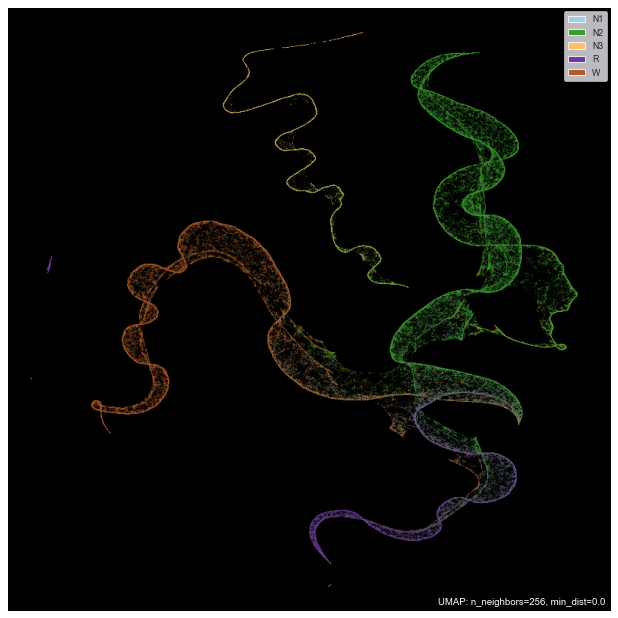

In [12]:
# Create a control-based embedding space

width = 800
height = 800
dpi = plt.rcParams["figure.dpi"]

# n_neighbors = [32, 64, 128, 256]
# min_dists = [0.25, 0.5, 0.75, 0.99]
n_neighbors = [256]
min_dists = [0.0]
umap_ops = {k: {v: [] for v in min_dists} for k in n_neighbors}
# f, axes = plt.subplots(nrows=len(n_neighbors), ncols=len(min_dist), dpi=300)
for (nn, d) in itertools.product(n_neighbors, min_dists):
    logging.info(f'knn={nn}, min_dist={d}')
    logging.info('\tCreating UMAP object')
    umap_op = UMAP(n_neighbors=nn, n_components=2, min_dist=d)
    logging.info('\tFitting UMAP to data')
    umap_ops[nn][d] = umap_op.fit(X)
    logging.info('\tPlotting embedded data')

    #     umap.plot.points(umap_op, labels=l, color_key_cmap='Paired', background='black')
    fig = plt.figure(figsize=(width / dpi, height / dpi))
    ax = fig.add_subplot(111)
    ax = umap.plot._datashade_points(umap_op.embedding_, ax=ax, labels=l, color_key_cmap='Paired', background='black')
    
    ax.set(xticks=[], yticks=[])
    ax.text(
        0.99,
        0.01,
        "UMAP: n_neighbors={}, min_dist={}".format(
            nn, d
        ),
        transform=ax.transAxes,
        horizontalalignment="right",
        color='white',
    )

    logging.info('\tSaving figure')
    try:
        save_path = f'results/umap/umap_knn{nn}_mindist{d}.png'
#         plt.savefig(save_path, dpi=300, bbox_inches='tight', pad_inches=0)
    except:
        save_path = f'results/umap_knn{nn}_mindist{d}.png'
#         plt.savefig(save_path, dpi=300, bbox_inches='tight', pad_inches=0)

# with open('results/umap_control_embeddings.pkl', 'wb') as f:
#     pickle.dump(umap_ops, f)

In [119]:
dump(umap_ops, 'results/umap_control_embeddings.pkl.gz')

MemoryError: 

08:13:04 INFO | Embedding narcoleptic subjects into control-based embedding space...
08:13:04 INFO | \Loading UMAP object, knn=256, min_dist=0.25
08:13:04 INFO | 	Embedding subject: SSC_6542_1
08:14:21 INFO | 	Plotting embedded data
08:14:21 INFO | 	Saving figure
08:14:23 INFO | 	Embedding subject: SSC_5335_1
08:14:33 INFO | 	Plotting embedded data
08:14:33 INFO | 	Saving figure
08:14:35 INFO | 	Embedding subject: SSC_4813_1
08:14:46 INFO | 	Plotting embedded data
08:14:47 INFO | 	Saving figure
08:14:48 INFO | 	Embedding subject: SSC_2605_1
08:15:00 INFO | 	Plotting embedded data
08:15:00 INFO | 	Saving figure
08:15:02 INFO | 	Embedding subject: SSC_4723_1
08:15:10 INFO | 	Plotting embedded data
08:15:11 INFO | 	Saving figure
08:15:12 INFO | 	Embedding subject: SSC_1958_1
08:15:22 INFO | 	Plotting embedded data
08:15:23 INFO | 	Saving figure
08:15:25 INFO | 	Embedding subject: SSC_5139_1
08:15:35 INFO | 	Plotting embedded data
08:15:36 INFO | 	Saving figure


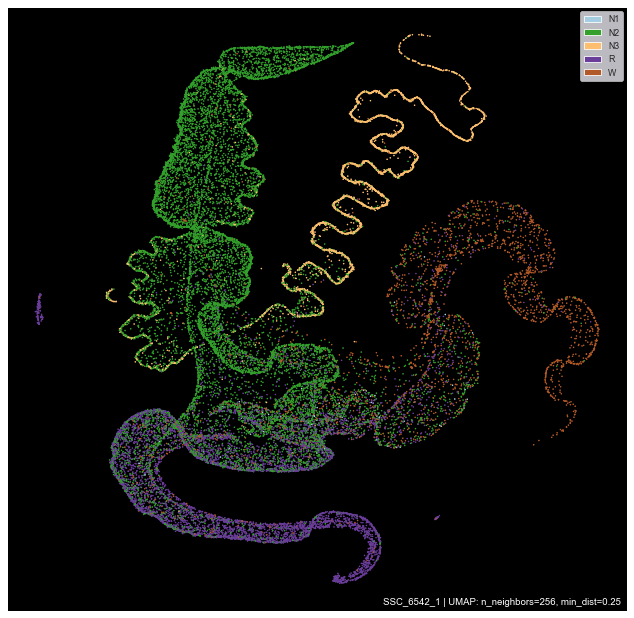

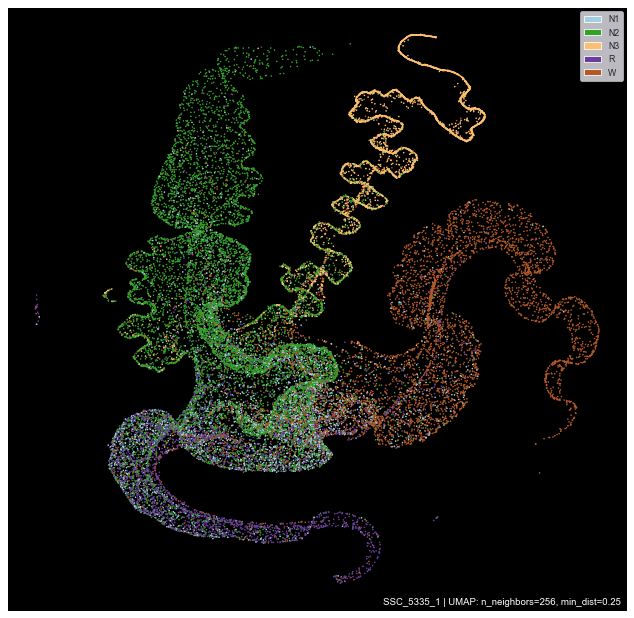

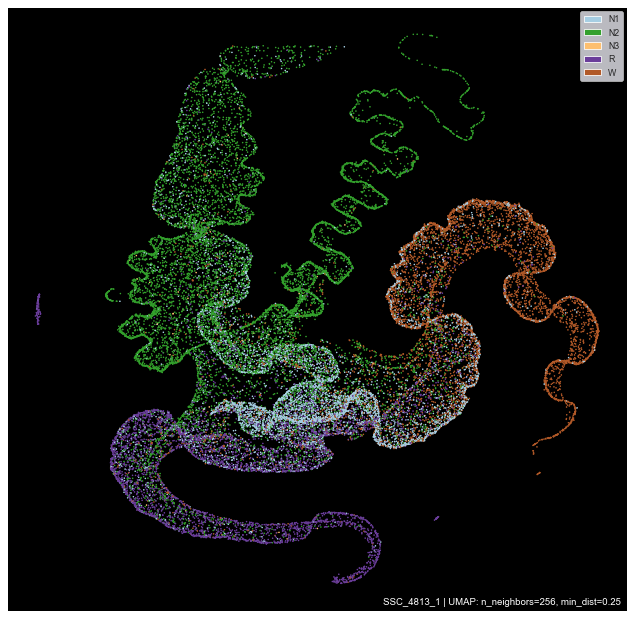

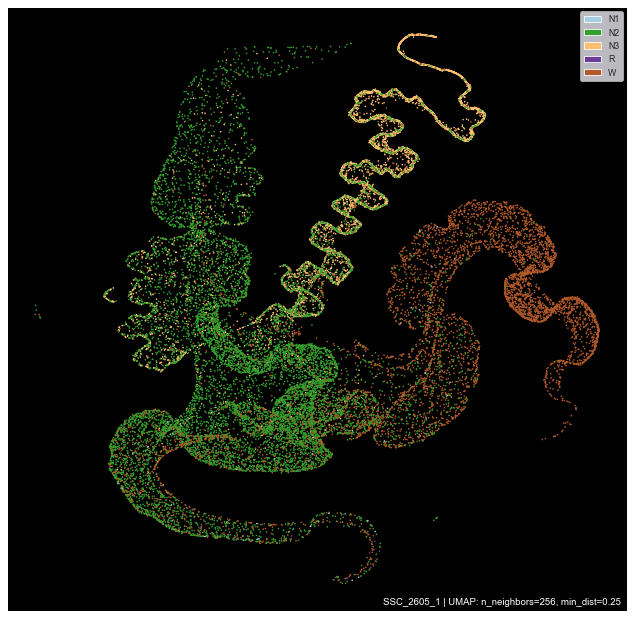

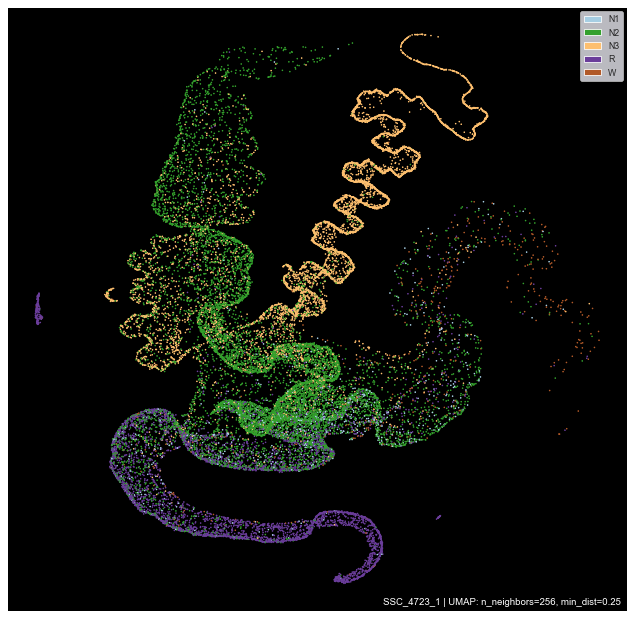

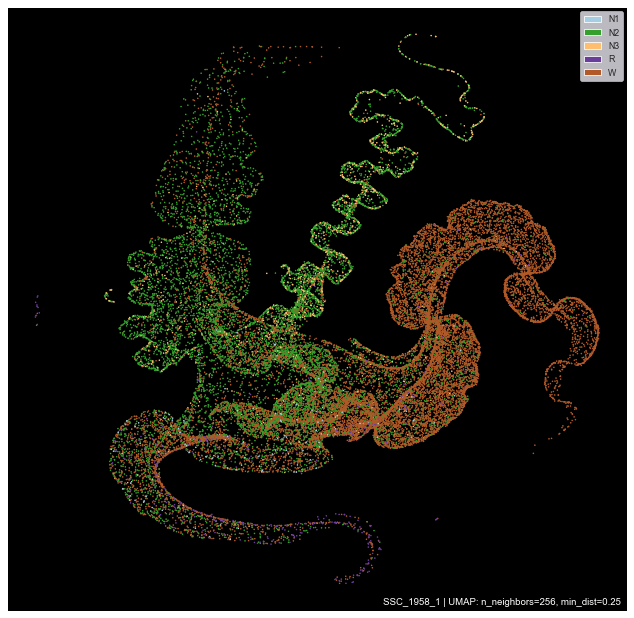

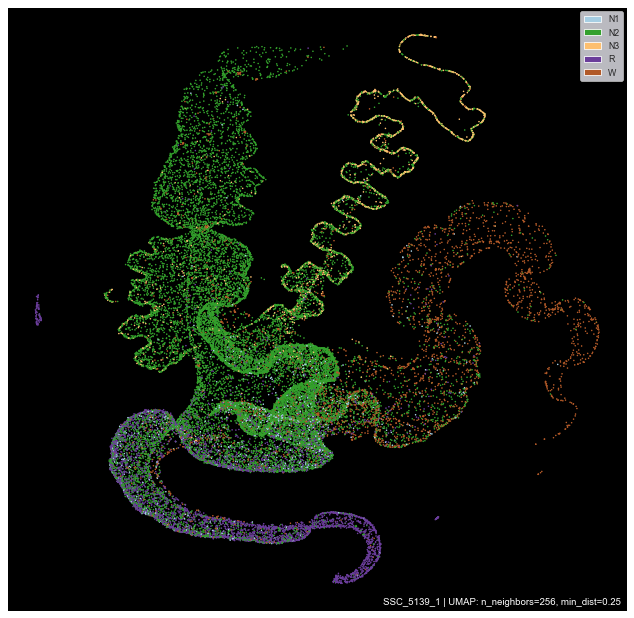

In [115]:
width = 800
height = 800
dpi = plt.rcParams["figure.dpi"]

n_knn = 256
min_dist = 0.25
logging.info('Embedding narcoleptic subjects into control-based embedding space...')

logging.info(f'\Loading UMAP object, knn={n_knn}, min_dist={min_dist}')
# with open('results/umap_control_embeddings.pkl', 'rb') as f:
#     umap_ops = pickle.load(f)
umap_trans = umap_ops[n_knn][min_dist]
calc
for _, row in narcs.iterrows():
    fileid = row['FileID']
    subjectid = row['SubjectID']
    logging.info(f'\tEmbedding subject: {subjectid}')
    record = predictions[fileid]
    X_narc = record['logits']
    X_narc_embedding = umap_trans.transform(X_narc)
    target_narc = record['true'].argmax(axis=1).repeat(30)
    labels_narc = np.array([HYP_DICT[t] for t in target_narc])
    logging.info('\tPlotting embedded data')
    
    fig = plt.figure(figsize=(width / dpi, height / dpi))
    ax = fig.add_subplot(111)
    
    ax = umap.plot._matplotlib_points(X_narc_embedding, ax=ax, labels=labels_narc, color_key_cmap='Paired', background='black')
    
    ax.set(xticks=[], yticks=[])
    ax.text(
        0.99,
        0.01,
        "{} | UMAP: n_neighbors={}, min_dist={}".format(
            subjectid, n_knn, min_dist
        ),
        transform=ax.transAxes,
        horizontalalignment="right",
        color='white',
    )
    logging.info('\tSaving figure')
    try:
        save_path = f'results/umap/umap_knn{n_knn}_mindist{min_dist}_{subjectid}.png'
        plt.savefig(save_path, dpi=300, bbox_inches='tight', pad_inches=0)
    except:
        save_path = f'results/umap_knn{n_knn}_mindist{min_dist}_{subjectid}_.png'
        plt.savefig(save_path, dpi=300, bbox_inches='tight', pad_inches=0)
    

Calculating PHATE...
  Running PHATE on 265500 observations and 5 variables.
  Calculating graph and diffusion operator...
    Calculating KNN search...
    Calculated KNN search in 64.66 seconds.
    Calculating affinities...


/home/neergaard/miniconda3/envs/pt1.7/lib/python3.7/site-packages/graphtools/graphs.py:293: RuntimeWarning: Detected zero distance between 1153 pairs of samples. Consider removing duplicates to avoid errors in downstream processing.
  RuntimeWarning,


    Calculated affinities in 20.02 seconds.
  Calculated graph and diffusion operator in 87.22 seconds.
  Calculating landmark operator...
    Calculating SVD...
    Calculated SVD in 166.91 seconds.
    Calculating KMeans...
    Calculated KMeans in 46.63 seconds.
  Calculated landmark operator in 219.15 seconds.
  Calculating optimal t...
    Automatically selected t = 76
  Calculated optimal t in 1.51 seconds.
  Calculating diffusion potential...
  Calculated diffusion potential in 0.94 seconds.
  Calculating metric MDS...
  Calculated metric MDS in 5.61 seconds.
Calculated PHATE in 314.46 seconds.
Calculating PHATE...
  Running PHATE on 265500 observations and 5 variables.
  Calculating graph and diffusion operator...
    Calculating KNN search...
    Calculated KNN search in 65.67 seconds.
    Calculating affinities...


/home/neergaard/miniconda3/envs/pt1.7/lib/python3.7/site-packages/graphtools/graphs.py:293: RuntimeWarning: Detected zero distance between 1153 pairs of samples. Consider removing duplicates to avoid errors in downstream processing.
  RuntimeWarning,


    Calculated affinities in 19.73 seconds.
  Calculated graph and diffusion operator in 87.99 seconds.
  Calculating landmark operator...
    Calculating SVD...
    Calculated SVD in 147.66 seconds.
    Calculating KMeans...
    Calculated KMeans in 47.05 seconds.
  Calculated landmark operator in 200.62 seconds.
  Calculating optimal t...
    Automatically selected t = 76
  Calculated optimal t in 1.54 seconds.
  Calculating diffusion potential...
  Calculated diffusion potential in 1.07 seconds.
  Calculating metric MDS...
  Calculated metric MDS in 5.66 seconds.
Calculated PHATE in 296.89 seconds.
Calculating PHATE...
  Running PHATE on 265500 observations and 5 variables.
  Calculating graph and diffusion operator...
    Calculating KNN search...
    Calculated KNN search in 65.71 seconds.
    Calculating affinities...


/home/neergaard/miniconda3/envs/pt1.7/lib/python3.7/site-packages/graphtools/graphs.py:293: RuntimeWarning: Detected zero distance between 1153 pairs of samples. Consider removing duplicates to avoid errors in downstream processing.
  RuntimeWarning,


    Calculated affinities in 19.96 seconds.
  Calculated graph and diffusion operator in 88.27 seconds.
  Calculating landmark operator...
    Calculating SVD...
    Calculated SVD in 147.20 seconds.
    Calculating KMeans...
    Calculated KMeans in 46.69 seconds.
  Calculated landmark operator in 199.83 seconds.
  Calculating optimal t...
    Automatically selected t = 76
  Calculated optimal t in 1.47 seconds.
  Calculating diffusion potential...
  Calculated diffusion potential in 0.86 seconds.
  Calculating metric MDS...
  Calculated metric MDS in 5.59 seconds.
Calculated PHATE in 296.03 seconds.
Calculating PHATE...
  Running PHATE on 265500 observations and 5 variables.
  Calculating graph and diffusion operator...
    Calculating KNN search...
    Calculated KNN search in 64.46 seconds.
    Calculating affinities...


/home/neergaard/miniconda3/envs/pt1.7/lib/python3.7/site-packages/graphtools/graphs.py:293: RuntimeWarning: Detected zero distance between 1153 pairs of samples. Consider removing duplicates to avoid errors in downstream processing.
  RuntimeWarning,


    Calculated affinities in 20.02 seconds.
  Calculated graph and diffusion operator in 87.05 seconds.
  Calculating landmark operator...
    Calculating SVD...
    Calculated SVD in 148.03 seconds.
    Calculating KMeans...
    Calculated KMeans in 46.63 seconds.
  Calculated landmark operator in 200.60 seconds.
  Calculating optimal t...
    Automatically selected t = 76
  Calculated optimal t in 1.53 seconds.
  Calculating diffusion potential...
  Calculated diffusion potential in 1.06 seconds.
  Calculating metric MDS...
  Calculated metric MDS in 5.60 seconds.
Calculated PHATE in 295.85 seconds.
Calculating PHATE...
  Running PHATE on 265500 observations and 5 variables.
  Calculating graph and diffusion operator...
    Calculating KNN search...
    Calculated KNN search in 64.79 seconds.
    Calculating affinities...


/home/neergaard/miniconda3/envs/pt1.7/lib/python3.7/site-packages/graphtools/graphs.py:293: RuntimeWarning: Detected zero distance between 1153 pairs of samples. Consider removing duplicates to avoid errors in downstream processing.
  RuntimeWarning,


    Calculated affinities in 19.93 seconds.
  Calculated graph and diffusion operator in 87.25 seconds.
  Calculating landmark operator...
    Calculating SVD...
    Calculated SVD in 150.01 seconds.
    Calculating KMeans...
    Calculated KMeans in 47.06 seconds.
  Calculated landmark operator in 202.95 seconds.
  Calculating optimal t...
    Automatically selected t = 76
  Calculated optimal t in 1.57 seconds.
  Calculating diffusion potential...
  Calculated diffusion potential in 0.86 seconds.
  Calculating metric MDS...
  Calculated metric MDS in 5.57 seconds.
Calculated PHATE in 298.22 seconds.


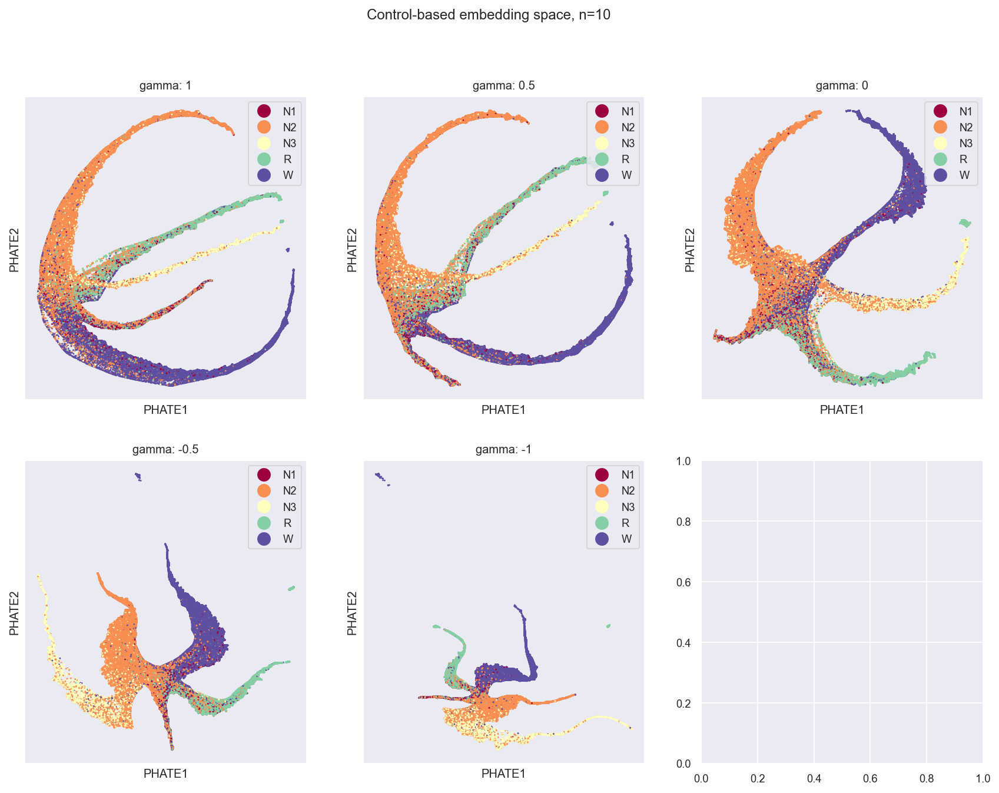

In [79]:
# Create a control-based embedding space
# f, axes = plt.subplots(nrows=2, ncols=3, dpi=300)
n_knn = 128
gamma = (1, 0.5, 0, -0.5, -1)
f, axes = plt.subplots(nrows=2, ncols=3, dpi=150)
for i, j, g in zip(
    (0, 0, 0, 1, 1),
    (0, 1, 2, 0, 1),
    gamma
):
    phate_op = phate.PHATE(n_jobs=-1, random_state=1337, knn=n_knn, gamma=g)
    y_phate = phate_op.fit_transform(X)
    title = f"gamma: {g}"
    scprep.plot.scatter2d(
        y_phate, 
        c=l,
        cmap='Spectral', 
        ticks=False, 
        label_prefix='PHATE', 
        ax=axes[i, j],
        title=title
    )
plt.suptitle(f'Control-based embedding space, n={10}')
plt.savefig(f'results/phate_control_embedding_gamma.png', dpi=300, bbox_inches='tight', pad_inches=0)

Calculating PHATE...
  Running PHATE on 265500 observations and 5 variables.
  Calculating graph and diffusion operator...
    Calculating KNN search...
    Calculated KNN search in 65.18 seconds.
    Calculating affinities...


/home/neergaard/miniconda3/envs/pt1.7/lib/python3.7/site-packages/graphtools/graphs.py:293: RuntimeWarning: Detected zero distance between 1153 pairs of samples. Consider removing duplicates to avoid errors in downstream processing.
  RuntimeWarning,


    Calculated affinities in 21.12 seconds.
  Calculated graph and diffusion operator in 88.89 seconds.
  Calculating landmark operator...
    Calculating SVD...
    Calculated SVD in 151.31 seconds.
    Calculating KMeans...
    Calculated KMeans in 46.84 seconds.
  Calculated landmark operator in 204.38 seconds.
  Calculating optimal t...
    Automatically selected t = 76
  Calculated optimal t in 1.49 seconds.
  Calculating diffusion potential...
  Calculated diffusion potential in 0.84 seconds.
  Calculating metric MDS...
  Calculated metric MDS in 5.83 seconds.
Calculated PHATE in 301.45 seconds.
Clustering using 3 clusters


/home/neergaard/miniconda3/envs/pt1.7/lib/python3.7/site-packages/sklearn/cluster/_kmeans.py:939: FutureWarning: 'n_jobs' was deprecated in version 0.23 and will be removed in 0.25.
  " removed in 0.25.", FutureWarning)


Clustering using 5 clusters


/home/neergaard/miniconda3/envs/pt1.7/lib/python3.7/site-packages/sklearn/cluster/_kmeans.py:939: FutureWarning: 'n_jobs' was deprecated in version 0.23 and will be removed in 0.25.
  " removed in 0.25.", FutureWarning)


Clustering using 10 clusters


/home/neergaard/miniconda3/envs/pt1.7/lib/python3.7/site-packages/sklearn/cluster/_kmeans.py:939: FutureWarning: 'n_jobs' was deprecated in version 0.23 and will be removed in 0.25.
  " removed in 0.25.", FutureWarning)


Clustering using 15 clusters


/home/neergaard/miniconda3/envs/pt1.7/lib/python3.7/site-packages/sklearn/cluster/_kmeans.py:939: FutureWarning: 'n_jobs' was deprecated in version 0.23 and will be removed in 0.25.
  " removed in 0.25.", FutureWarning)


Clustering using 20 clusters


/home/neergaard/miniconda3/envs/pt1.7/lib/python3.7/site-packages/sklearn/cluster/_kmeans.py:939: FutureWarning: 'n_jobs' was deprecated in version 0.23 and will be removed in 0.25.
  " removed in 0.25.", FutureWarning)


Clustering using 25 clusters


/home/neergaard/miniconda3/envs/pt1.7/lib/python3.7/site-packages/sklearn/cluster/_kmeans.py:939: FutureWarning: 'n_jobs' was deprecated in version 0.23 and will be removed in 0.25.
  " removed in 0.25.", FutureWarning)


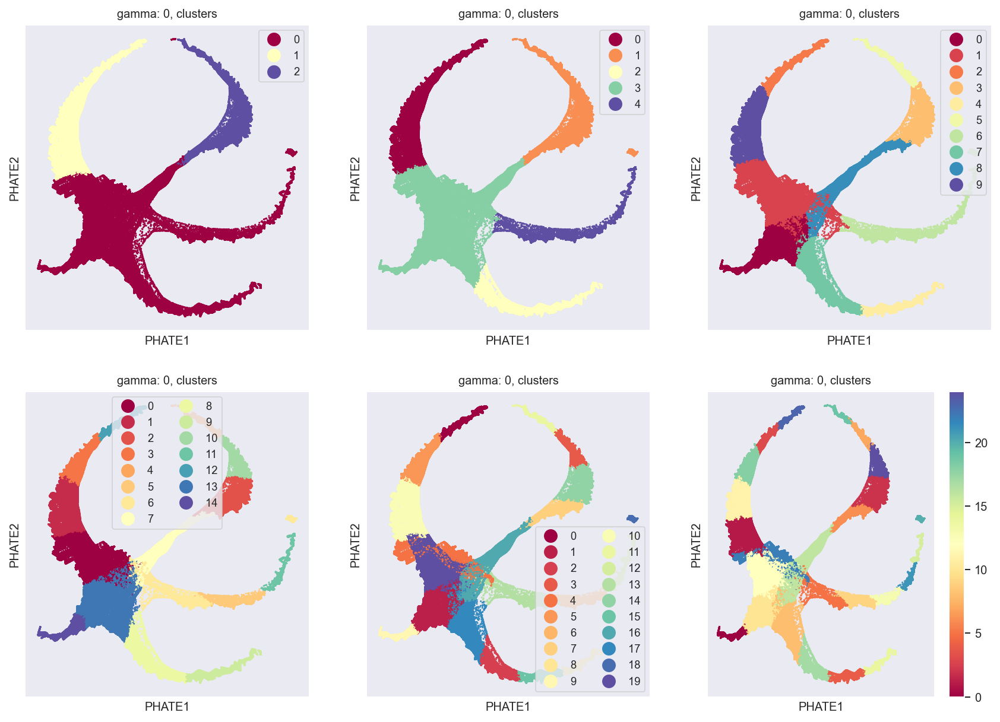

In [85]:
n_knn = 128
gamma = 0
phate_op = phate.PHATE(n_jobs=-1, random_state=1337, knn=n_knn, gamma=gamma)
y_phate = phate_op.fit_transform(X)
f, axes = plt.subplots(nrows=2, ncols=3, dpi=150)
n_clusters = [3, 5, 10, 15, 20, 25]
for i, j, nc in zip(
    (0, 0, 0, 1, 1, 1),
    (0, 1, 2, 0, 1, 2),
    n_clusters
):
#     if nc == 5:
    print(f'Clustering using {nc} clusters')
    cluster_assignments = phate.cluster.kmeans(phate_op, n_clusters=nc, max_clusters=30, random_state=1337, n_jobs=-1)
#         title=f'gamma: {gamma}, sleep stages'
#         scprep.plot.scatter2d(
#             y_phate, 
#             c=l,
#             cmap='Spectral', 
#             ticks=False, 
#             label_prefix='PHATE', 
#             ax=axes[0],
#             title=title
#         )
    title=f'gamma: {gamma}, clusters'
    scprep.plot.scatter2d(
        y_phate, 
        c=cluster_assignments,
        cmap='Spectral', 
        ticks=False, 
        label_prefix='PHATE', 
        ax=axes[i, j],
        title=title
    )

Clustering using 3 clusters


/home/neergaard/miniconda3/envs/pt1.7/lib/python3.7/site-packages/sklearn/cluster/_kmeans.py:939: FutureWarning: 'n_jobs' was deprecated in version 0.23 and will be removed in 0.25.
  " removed in 0.25.", FutureWarning)


Clustering using 5 clusters


/home/neergaard/miniconda3/envs/pt1.7/lib/python3.7/site-packages/sklearn/cluster/_kmeans.py:939: FutureWarning: 'n_jobs' was deprecated in version 0.23 and will be removed in 0.25.
  " removed in 0.25.", FutureWarning)


Clustering using 10 clusters


/home/neergaard/miniconda3/envs/pt1.7/lib/python3.7/site-packages/sklearn/cluster/_kmeans.py:939: FutureWarning: 'n_jobs' was deprecated in version 0.23 and will be removed in 0.25.
  " removed in 0.25.", FutureWarning)


Clustering using 15 clusters


/home/neergaard/miniconda3/envs/pt1.7/lib/python3.7/site-packages/sklearn/cluster/_kmeans.py:939: FutureWarning: 'n_jobs' was deprecated in version 0.23 and will be removed in 0.25.
  " removed in 0.25.", FutureWarning)


Clustering using 20 clusters


/home/neergaard/miniconda3/envs/pt1.7/lib/python3.7/site-packages/sklearn/cluster/_kmeans.py:939: FutureWarning: 'n_jobs' was deprecated in version 0.23 and will be removed in 0.25.
  " removed in 0.25.", FutureWarning)


Clustering using 25 clusters


/home/neergaard/miniconda3/envs/pt1.7/lib/python3.7/site-packages/sklearn/cluster/_kmeans.py:939: FutureWarning: 'n_jobs' was deprecated in version 0.23 and will be removed in 0.25.
  " removed in 0.25.", FutureWarning)


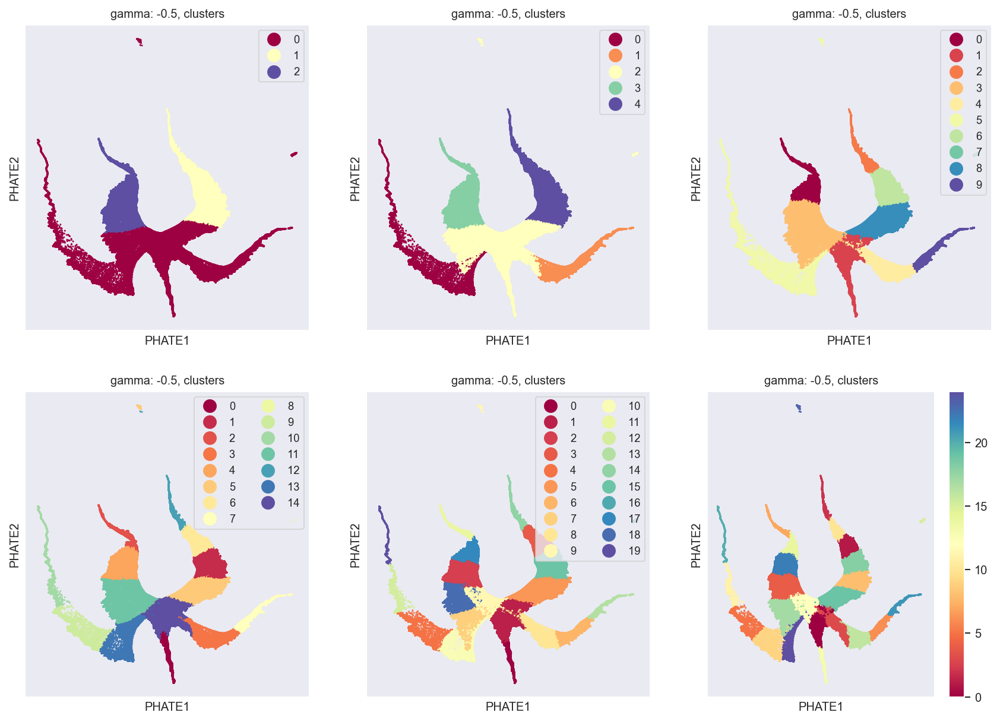

In [83]:
n_knn = 128
gamma = -0.5
# phate_op = phate.PHATE(n_jobs=-1, random_state=1337, knn=n_knn, gamma=gamma)
# y_phate = phate_op.fit_transform(X)
f, axes = plt.subplots(nrows=2, ncols=3, dpi=150)
n_clusters = [3, 5, 10, 15, 20, 25]
for i, j, nc in zip(
    (0, 0, 0, 1, 1, 1),
    (0, 1, 2, 0, 1, 2),
    n_clusters
):
#     if nc == 5:
    print(f'Clustering using {nc} clusters')
    cluster_assignments = phate.cluster.kmeans(phate_op, n_clusters=nc, max_clusters=30, random_state=1337, n_jobs=-1)
#         title=f'gamma: {gamma}, sleep stages'
#         scprep.plot.scatter2d(
#             y_phate, 
#             c=l,
#             cmap='Spectral', 
#             ticks=False, 
#             label_prefix='PHATE', 
#             ax=axes[0],
#             title=title
#         )
    title=f'gamma: {gamma}, clusters'
    scprep.plot.scatter2d(
        y_phate, 
        c=cluster_assignments,
        cmap='Spectral', 
        ticks=False, 
        label_prefix='PHATE', 
        ax=axes[i, j],
        title=title
    )

In [ ]:
X = []
y = []
l = []
d = []
for idx, selected_record in top10_controls.iterrows():
    fileid = selected_record['FileID']
    diagnosis = selected_record['Diagnosis'].replace("'", "")
    record = predictions[fileid]
    logits = record['logits']
    target = record['true'].argmax(axis=1).repeat(30)
    labels = np.array([HYP_DICT[t] for t in target])
    labels_disease = [diagnosis for _ in range(len(target))]
    
    X.append(logits)
    y.append(target)
    l.append(labels)
    d.extend(labels_disease)
    
X = np.concatenate(X, axis=0)
y = np.concatenate(y, axis=0)
l = np.concatenate(l, axis=0)

In [97]:
phate_op.transform(X=X_narc)

Calculating KNN search...


/home/neergaard/miniconda3/envs/pt1.7/lib/python3.7/site-packages/phate/phate.py:881: RuntimeWarning: Pre-fit PHATE should not be used to transform a new data matrix. Please fit PHATE to the new data by running 'fit' with the new data.
  RuntimeWarning,


Calculated KNN search in 6.87 seconds.
Calculating affinities...


/home/neergaard/miniconda3/envs/pt1.7/lib/python3.7/site-packages/graphtools/graphs.py:293: RuntimeWarning: Detected zero distance between 123 pairs of samples. Consider removing duplicates to avoid errors in downstream processing.
  RuntimeWarning,


Calculated affinities in 2.34 seconds.


array([[ 0.01309084,  0.01131705],
       [ 0.01349435,  0.01417757],
       [ 0.01410813,  0.01094078],
       ...,
       [-0.01325141,  0.00453331],
       [ 0.00039783, -0.01865293],
       [ 0.00860233, -0.0207269 ]])

Calculating KNN search...


/home/neergaard/miniconda3/envs/pt1.7/lib/python3.7/site-packages/phate/phate.py:881: RuntimeWarning: Pre-fit PHATE should not be used to transform a new data matrix. Please fit PHATE to the new data by running 'fit' with the new data.
  RuntimeWarning,


Calculated KNN search in 7.44 seconds.
Calculating affinities...


/home/neergaard/miniconda3/envs/pt1.7/lib/python3.7/site-packages/graphtools/graphs.py:293: RuntimeWarning: Detected zero distance between 123 pairs of samples. Consider removing duplicates to avoid errors in downstream processing.
  RuntimeWarning,


Calculated affinities in 2.33 seconds.
Calculating KNN search...


/home/neergaard/miniconda3/envs/pt1.7/lib/python3.7/site-packages/phate/phate.py:881: RuntimeWarning: Pre-fit PHATE should not be used to transform a new data matrix. Please fit PHATE to the new data by running 'fit' with the new data.
  RuntimeWarning,


Calculated KNN search in 6.82 seconds.
Calculating affinities...


/home/neergaard/miniconda3/envs/pt1.7/lib/python3.7/site-packages/graphtools/graphs.py:293: RuntimeWarning: Detected zero distance between 123 pairs of samples. Consider removing duplicates to avoid errors in downstream processing.
  RuntimeWarning,


Calculated affinities in 4.00 seconds.
Calculating KNN search...


/home/neergaard/miniconda3/envs/pt1.7/lib/python3.7/site-packages/phate/phate.py:881: RuntimeWarning: Pre-fit PHATE should not be used to transform a new data matrix. Please fit PHATE to the new data by running 'fit' with the new data.
  RuntimeWarning,


Calculated KNN search in 6.72 seconds.
Calculating affinities...


/home/neergaard/miniconda3/envs/pt1.7/lib/python3.7/site-packages/graphtools/graphs.py:293: RuntimeWarning: Detected zero distance between 123 pairs of samples. Consider removing duplicates to avoid errors in downstream processing.
  RuntimeWarning,


Calculated affinities in 2.33 seconds.
Calculating KNN search...


/home/neergaard/miniconda3/envs/pt1.7/lib/python3.7/site-packages/phate/phate.py:881: RuntimeWarning: Pre-fit PHATE should not be used to transform a new data matrix. Please fit PHATE to the new data by running 'fit' with the new data.
  RuntimeWarning,


Calculated KNN search in 6.59 seconds.
Calculating affinities...


/home/neergaard/miniconda3/envs/pt1.7/lib/python3.7/site-packages/graphtools/graphs.py:293: RuntimeWarning: Detected zero distance between 123 pairs of samples. Consider removing duplicates to avoid errors in downstream processing.
  RuntimeWarning,


Calculated affinities in 2.32 seconds.


KeyboardInterrupt: 

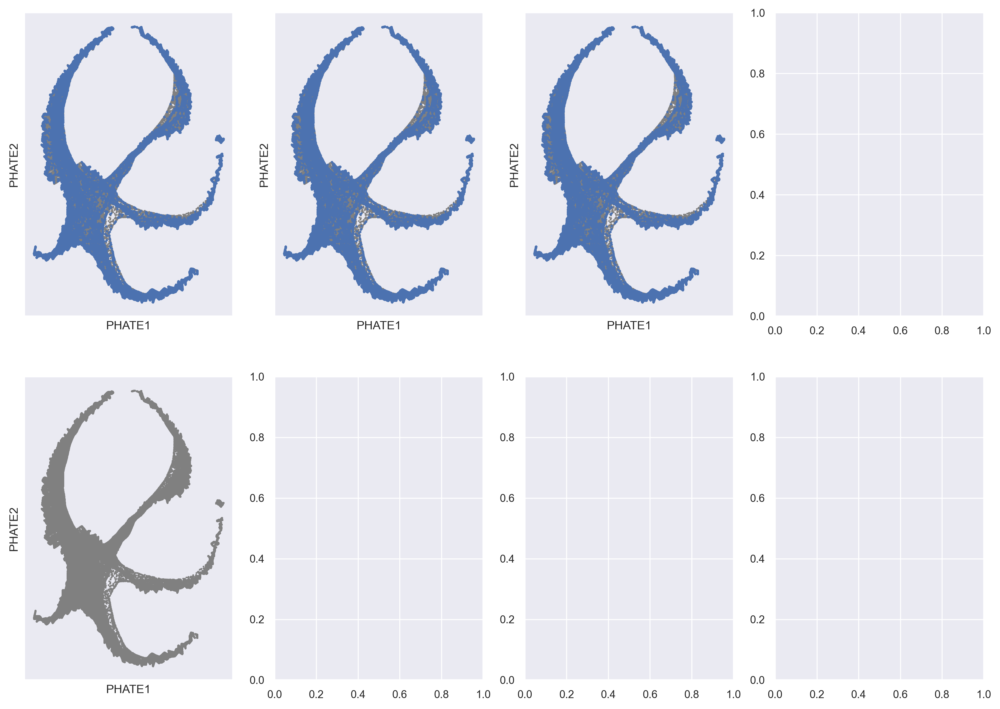

In [93]:
# n_knn = 128
# gamma = 0
# phate_op = phate.PHATE(n_jobs=-1, random_state=1337, knn=n_knn, gamma=gamma)
# y_phate = phate_op.fit_transform(X)
f, axes = plt.subplots(nrows=2, ncols=4, dpi=300)
for i, j, row in zip(
    (0, 0, 0, 1, 1, 1),
    (0, 1, 2, 0, 1, 2),
    narcs.iterrows()
):
    scprep.plot.scatter2d(
        y_phate, 
        c='gray',
#         c=cluster_assignments,
#         cmap='gray', 
        ticks=False, 
        label_prefix='PHATE', 
        ax=axes[i, j],
#         title=title
    )
#     print(row)
    fileid = selected_record['FileID']
#     diagnosis = selected_record['Diagnosis'].replace("'", "")
#     record = predictions[fileid]
    X_narc = record['logits']
    y_narc = phate_op.transform(X=X_narc, t_max=100, plot_optimal_t=False, ax=None)
    scprep.plot.scatter2d(
        y_narc, 
#         c='gray',
#         c=cluster_assignments,
        cmap='Spectral', 
        ticks=False, 
        label_prefix='PHATE', 
        ax=axes[i, j],
#         title=title
    )
#     target = record['true'].argmax(axis=1).repeat(30)
#     labels = np.array([HYP_DICT[t] for t in target])
#     labels_disease = [diagnosis for _ in range(len(target))]
#     if nc == 5:
#     print(f'Clustering using {nc} clusters')
#     cluster_assignments = phate.cluster.kmeans(phate_op, n_clusters=nc, max_clusters=30, random_state=1337, n_jobs=-1)
#         title=f'gamma: {gamma}, sleep stages'
#         scprep.plot.scatter2d(
#             y_phate, 
#             c=l,
#             cmap='Spectral', 
#             ticks=False, 
#             label_prefix='PHATE', 
#             ax=axes[0],
#             title=title
#         )
#     title=f'gamma: {gamma}, clusters'
    
    

In [6]:
selected_top10

,FileID,SubjectID,Window,Case,Accuracy,Balanced accuracy,Kappa,F1,Precision,Recall,...,Precision - N3,Recall - N3,Support - N3,F1 - REM,Precision - REM,Recall - REM,Support - REM,ID,Diagnosis,Label
0,C0046_4 173331.h5,C0046_4 173331,1 s,all,0.951432,0.644655,0.591231,0.697157,0.774501,0.644655,...,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.0,C0046_4 173331,'NON-NARCOLEPSY CONTROL',0
1,SSC_5254_1.h5,SSC_5254_1,1 s,all,0.939673,0.860957,0.850046,0.784946,0.790100,0.860957,...,0.947368,0.947368,57.0,0.000000,0.000000,0.000000,0.0,SSC_5254_1,'NON-NARCOLEPSY CONTROL',0
2,C1584_3 172654.h5,C1584_3 172654,1 s,all,0.912027,0.815213,0.865526,0.784308,0.761220,0.815213,...,0.485714,0.586207,29.0,0.896175,0.872340,0.921348,89.0,C1584_3 172654,'NON-NARCOLEPSY CONTROL',0
3,A2202_3 171828.h5,A2202_3 171828,1 s,all,0.908976,0.836763,0.793684,0.777232,0.766219,0.836763,...,0.705128,1.000000,55.0,0.805970,0.692308,0.964286,28.0,A2202_3 171828,'NON-NARCOLEPSY CONTROL',0
4,A0147_6 165655.h5,A0147_6 165655,1 s,all,0.900966,0.871082,0.842300,0.800551,0.769639,0.871082,...,0.597015,0.851064,47.0,0.938462,0.945736,0.931298,131.0,A0147_6 165655,'NON-NARCOLEPSY CONTROL',0
5,SSC_5547_1.h5,SSC_5547_1,1 s,all,0.899548,0.877883,0.848494,0.850218,0.828665,0.877883,...,0.808383,0.957447,141.0,0.951220,0.917647,0.987342,158.0,SSC_5547_1,'NON-NARCOLEPSY CONTROL',0
6,SSC_5017_1.h5,SSC_5017_1,1 s,all,0.897959,0.744431,0.724751,0.728063,0.724796,0.744431,...,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.0,SSC_5017_1,'NON-NARCOLEPSY CONTROL',0
7,N4499_2 092211.h5,N4499_2 092211,1 s,all,0.890519,0.819924,0.828192,0.785691,0.766977,0.819924,...,0.702381,0.855072,69.0,0.953930,0.926316,0.983240,179.0,N4499_2 092211,'NON-NARCOLEPSY CONTROL',0
8,A0531_6 175138.h5,A0531_6 175138,1 s,all,0.888331,0.871765,0.843528,0.832315,0.819650,0.871765,...,0.758065,0.824561,57.0,0.928910,0.980000,0.882883,111.0,A0531_6 175138,'NON-NARCOLEPSY CONTROL',0
9,C2209_4 233629.h5,C2209_4 233629,1 s,all,0.888122,0.854197,0.844454,0.833848,0.834242,0.854197,...,0.915254,0.739726,73.0,0.960396,0.960396,0.960396,101.0,C2209_4 233629,'NON-NARCOLEPSY CONTROL',0


Calculating PHATE...
  Running PHATE on 621300 observations and 5 variables.
  Calculating graph and diffusion operator...
    Calculating KNN search...
    Calculated KNN search in 46.18 seconds.
    Calculating affinities...


/home/groups/mignot/miniconda3/envs/pt1.7/lib/python3.7/site-packages/graphtools/graphs.py:293: RuntimeWarning: Detected zero distance between 10014 pairs of samples. Consider removing duplicates to avoid errors in downstream processing.
  RuntimeWarning,
/home/groups/mignot/miniconda3/envs/pt1.7/lib/python3.7/site-packages/graphtools/graphs.py:451: RuntimeWarning: overflow encountered in power
  K.data = np.exp(-1 * np.power(K.data, self.decay))


    Calculated affinities in 8.83 seconds.
  Calculated graph and diffusion operator in 55.42 seconds.
  Calculating landmark operator...
    Calculating SVD...
    Calculated SVD in 60.54 seconds.
    Calculating KMeans...
    Calculated KMeans in 48.50 seconds.
  Calculated landmark operator in 120.90 seconds.
  Calculating optimal t...
    Automatically selected t = 66
  Calculated optimal t in 0.69 seconds.
  Calculating diffusion potential...
  Calculated diffusion potential in 0.40 seconds.
  Calculating metric MDS...
  Calculated metric MDS in 6.01 seconds.
Calculated PHATE in 183.46 seconds.
Calculating PHATE...
  Running PHATE on 621300 observations and 5 variables.
  Calculating graph and diffusion operator...
    Calculating KNN search...
    Calculated KNN search in 60.88 seconds.
    Calculating affinities...


/home/groups/mignot/miniconda3/envs/pt1.7/lib/python3.7/site-packages/graphtools/graphs.py:293: RuntimeWarning: Detected zero distance between 19494 pairs of samples. Consider removing duplicates to avoid errors in downstream processing.
  RuntimeWarning,
/home/groups/mignot/miniconda3/envs/pt1.7/lib/python3.7/site-packages/graphtools/graphs.py:451: RuntimeWarning: overflow encountered in power
  K.data = np.exp(-1 * np.power(K.data, self.decay))


    Calculated affinities in 12.59 seconds.
  Calculated graph and diffusion operator in 74.34 seconds.
  Calculating landmark operator...
    Calculating SVD...
    Calculated SVD in 85.01 seconds.
    Calculating KMeans...
    Calculated KMeans in 45.31 seconds.
  Calculated landmark operator in 142.41 seconds.
  Calculating optimal t...
    Automatically selected t = 51
  Calculated optimal t in 0.67 seconds.
  Calculating diffusion potential...
  Calculated diffusion potential in 0.43 seconds.
  Calculating metric MDS...
  Calculated metric MDS in 5.99 seconds.
Calculated PHATE in 223.88 seconds.
Calculating PHATE...
  Running PHATE on 621300 observations and 5 variables.
  Calculating graph and diffusion operator...
    Calculating KNN search...
    Calculated KNN search in 76.87 seconds.
    Calculating affinities...


/home/groups/mignot/miniconda3/envs/pt1.7/lib/python3.7/site-packages/graphtools/graphs.py:293: RuntimeWarning: Detected zero distance between 27500 pairs of samples. Consider removing duplicates to avoid errors in downstream processing.
  RuntimeWarning,
/home/groups/mignot/miniconda3/envs/pt1.7/lib/python3.7/site-packages/graphtools/graphs.py:451: RuntimeWarning: overflow encountered in power
  K.data = np.exp(-1 * np.power(K.data, self.decay))


    Calculated affinities in 15.16 seconds.
  Calculated graph and diffusion operator in 93.50 seconds.
  Calculating landmark operator...
    Calculating SVD...
    Calculated SVD in 112.37 seconds.
    Calculating KMeans...
    Calculated KMeans in 14.84 seconds.
  Calculated landmark operator in 139.23 seconds.
  Calculating optimal t...
    Automatically selected t = 53
  Calculated optimal t in 0.63 seconds.
  Calculating diffusion potential...
  Calculated diffusion potential in 0.44 seconds.
  Calculating metric MDS...
  Calculated metric MDS in 5.87 seconds.
Calculated PHATE in 239.70 seconds.
Calculating PHATE...
  Running PHATE on 621300 observations and 5 variables.
  Calculating graph and diffusion operator...
    Calculating KNN search...
    Calculated KNN search in 109.34 seconds.
    Calculating affinities...


/home/groups/mignot/miniconda3/envs/pt1.7/lib/python3.7/site-packages/graphtools/graphs.py:293: RuntimeWarning: Detected zero distance between 29866 pairs of samples. Consider removing duplicates to avoid errors in downstream processing.
  RuntimeWarning,
/home/groups/mignot/miniconda3/envs/pt1.7/lib/python3.7/site-packages/graphtools/graphs.py:451: RuntimeWarning: overflow encountered in power
  K.data = np.exp(-1 * np.power(K.data, self.decay))


    Calculated affinities in 22.09 seconds.
  Calculated graph and diffusion operator in 134.32 seconds.
  Calculating landmark operator...
    Calculating SVD...
    Calculated SVD in 179.89 seconds.
    Calculating KMeans...
    Calculated KMeans in 52.78 seconds.
  Calculated landmark operator in 244.95 seconds.
  Calculating optimal t...
    Automatically selected t = 69
  Calculated optimal t in 0.64 seconds.
  Calculating diffusion potential...
  Calculated diffusion potential in 0.44 seconds.
  Calculating metric MDS...
  Calculated metric MDS in 5.90 seconds.
Calculated PHATE in 386.29 seconds.
Calculating PHATE...
  Running PHATE on 621300 observations and 5 variables.
  Calculating graph and diffusion operator...
    Calculating KNN search...
    Calculated KNN search in 168.15 seconds.
    Calculating affinities...


/home/groups/mignot/miniconda3/envs/pt1.7/lib/python3.7/site-packages/graphtools/graphs.py:293: RuntimeWarning: Detected zero distance between 29866 pairs of samples. Consider removing duplicates to avoid errors in downstream processing.
  RuntimeWarning,
/home/groups/mignot/miniconda3/envs/pt1.7/lib/python3.7/site-packages/graphtools/graphs.py:451: RuntimeWarning: overflow encountered in power
  K.data = np.exp(-1 * np.power(K.data, self.decay))


    Calculated affinities in 42.15 seconds.
  Calculated graph and diffusion operator in 216.14 seconds.
  Calculating landmark operator...
    Calculating SVD...
    Calculated SVD in 310.94 seconds.
    Calculating KMeans...
    Calculated KMeans in 59.57 seconds.
  Calculated landmark operator in 383.30 seconds.
  Calculating optimal t...
    Automatically selected t = 25
  Calculated optimal t in 0.64 seconds.
  Calculating diffusion potential...
  Calculated diffusion potential in 0.37 seconds.
  Calculating metric MDS...
  Calculated metric MDS in 5.92 seconds.
Calculated PHATE in 606.40 seconds.
Calculating PHATE...
  Running PHATE on 621300 observations and 5 variables.
  Calculating graph and diffusion operator...
    Calculating KNN search...
    Calculated KNN search in 212.19 seconds.
    Calculating affinities...


/home/groups/mignot/miniconda3/envs/pt1.7/lib/python3.7/site-packages/graphtools/graphs.py:293: RuntimeWarning: Detected zero distance between 29866 pairs of samples. Consider removing duplicates to avoid errors in downstream processing.
  RuntimeWarning,
/home/groups/mignot/miniconda3/envs/pt1.7/lib/python3.7/site-packages/graphtools/graphs.py:451: RuntimeWarning: overflow encountered in power
  K.data = np.exp(-1 * np.power(K.data, self.decay))


    Calculated affinities in 61.36 seconds.
  Calculated graph and diffusion operator in 282.64 seconds.
  Calculating landmark operator...
    Calculating SVD...
    Calculated SVD in 440.20 seconds.
    Calculating KMeans...
    Calculated KMeans in 63.81 seconds.
  Calculated landmark operator in 517.03 seconds.
  Calculating optimal t...
    Automatically selected t = 23
  Calculated optimal t in 0.64 seconds.
  Calculating diffusion potential...
  Calculated diffusion potential in 0.39 seconds.
  Calculating metric MDS...
  Calculated metric MDS in 5.86 seconds.
Calculated PHATE in 806.58 seconds.
Calculating PHATE...
  Running PHATE on 621300 observations and 5 variables.
  Calculating graph and diffusion operator...
    Calculating KNN search...
    Calculated KNN search in 323.94 seconds.
    Calculating affinities...


/home/groups/mignot/miniconda3/envs/pt1.7/lib/python3.7/site-packages/graphtools/graphs.py:293: RuntimeWarning: Detected zero distance between 29866 pairs of samples. Consider removing duplicates to avoid errors in downstream processing.
  RuntimeWarning,


    Calculated affinities in 80.91 seconds.
  Calculated graph and diffusion operator in 417.76 seconds.
  Calculating landmark operator...
    Calculating SVD...
    Calculated SVD in 576.60 seconds.
    Calculating KMeans...
    Calculated KMeans in 64.52 seconds.
  Calculated landmark operator in 654.83 seconds.
  Calculating optimal t...
    Automatically selected t = 19
  Calculated optimal t in 0.63 seconds.
  Calculating diffusion potential...
  Calculated diffusion potential in 0.34 seconds.
  Calculating metric MDS...
  Calculated metric MDS in 6.08 seconds.
Calculated PHATE in 1079.67 seconds.
Calculating PHATE...
  Running PHATE on 621300 observations and 5 variables.
  Calculating graph and diffusion operator...
    Calculating KNN search...
    Calculated KNN search in 363.10 seconds.
    Calculating affinities...


/home/groups/mignot/miniconda3/envs/pt1.7/lib/python3.7/site-packages/graphtools/graphs.py:293: RuntimeWarning: Detected zero distance between 29866 pairs of samples. Consider removing duplicates to avoid errors in downstream processing.
  RuntimeWarning,


    Calculated affinities in 101.30 seconds.
  Calculated graph and diffusion operator in 482.10 seconds.
  Calculating landmark operator...
    Calculating SVD...
    Calculated SVD in 713.58 seconds.
    Calculating KMeans...
    Calculated KMeans in 82.14 seconds.
  Calculated landmark operator in 809.60 seconds.
  Calculating optimal t...
    Automatically selected t = 21
  Calculated optimal t in 0.67 seconds.
  Calculating diffusion potential...
  Calculated diffusion potential in 0.35 seconds.
  Calculating metric MDS...
  Calculated metric MDS in 6.08 seconds.
Calculated PHATE in 1298.82 seconds.


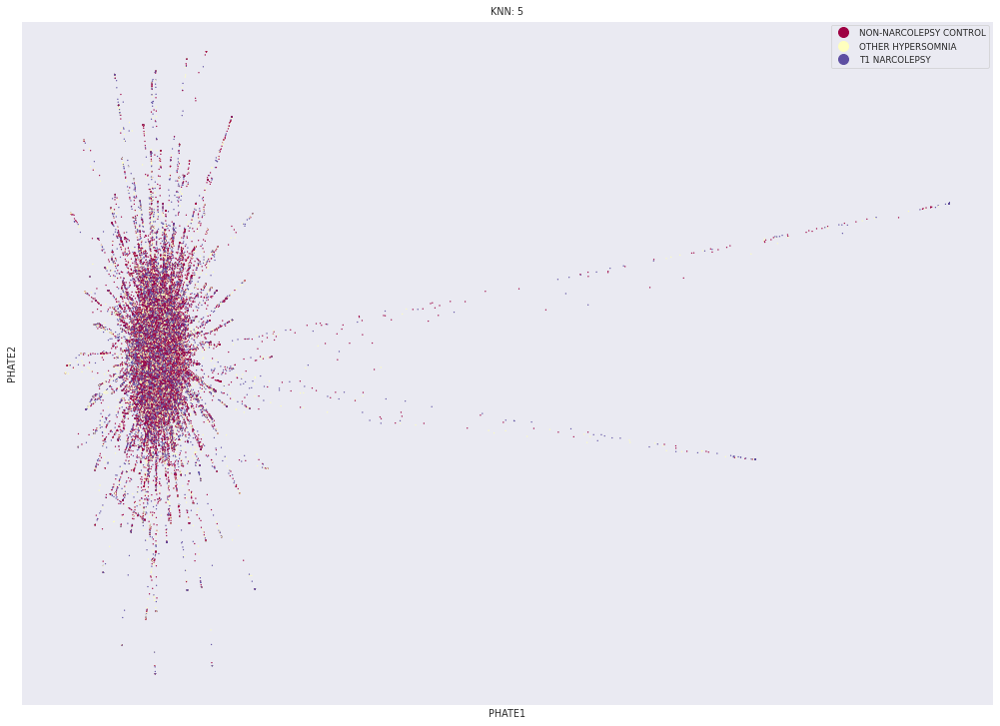

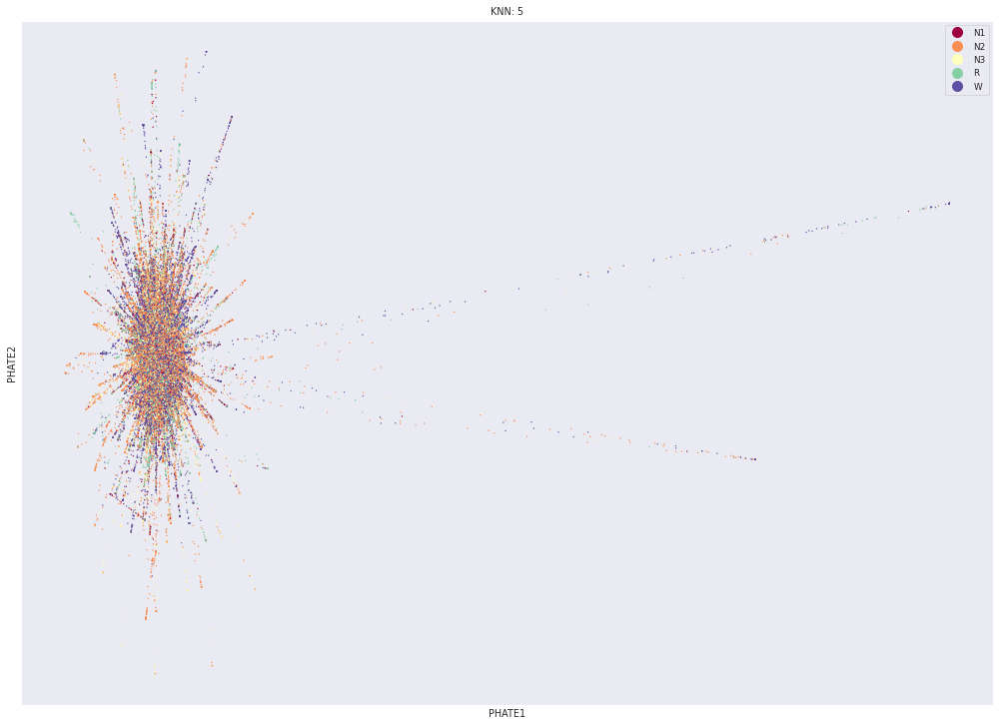

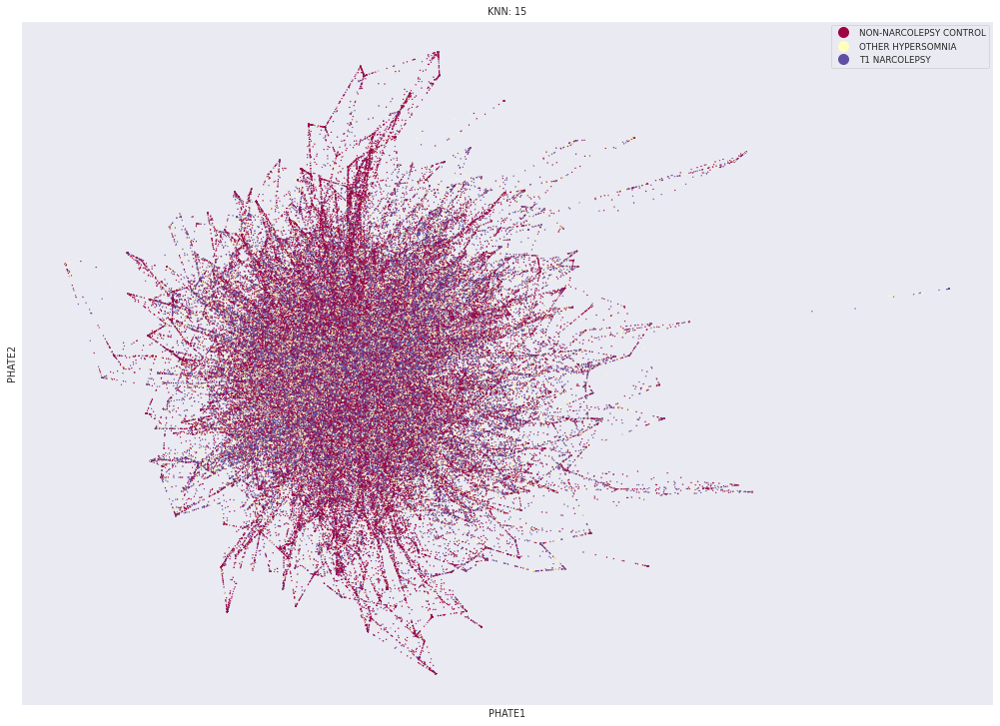

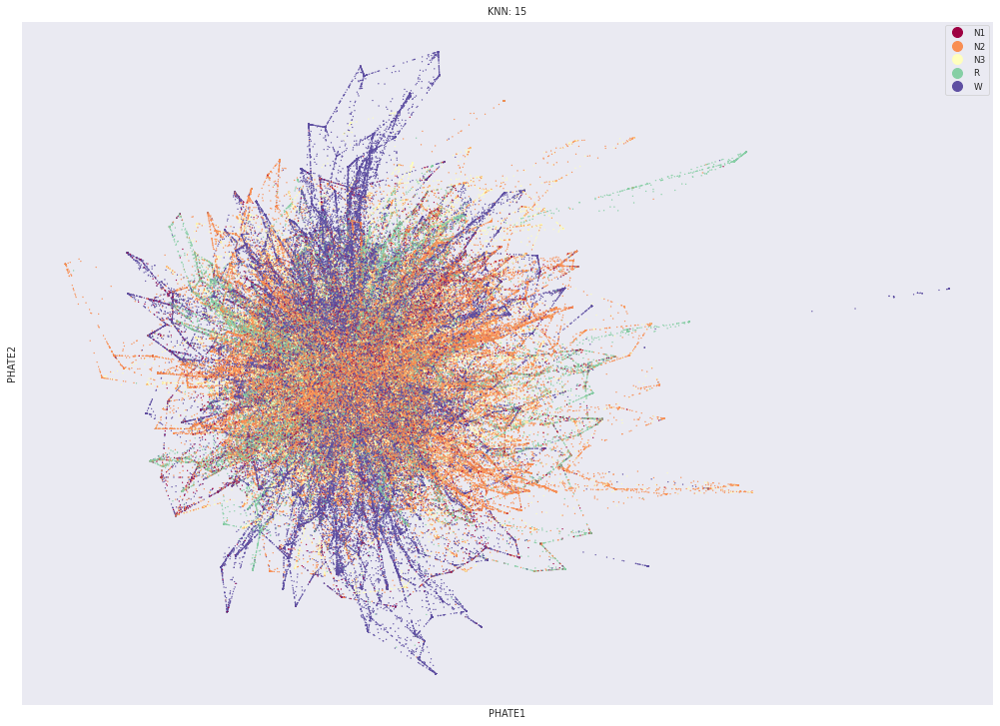

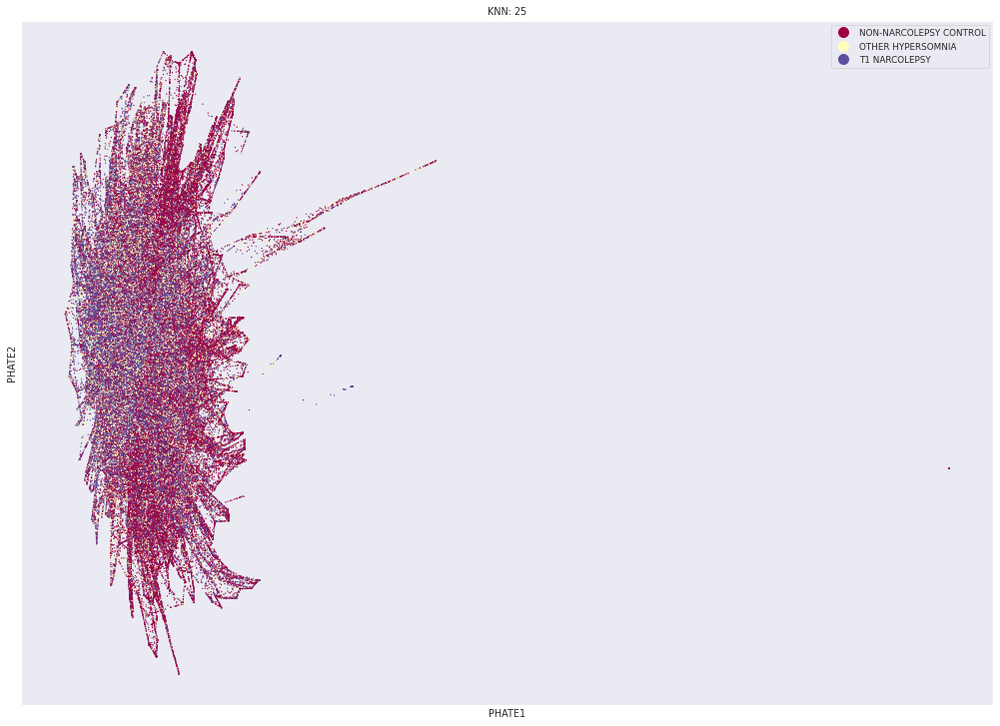

...

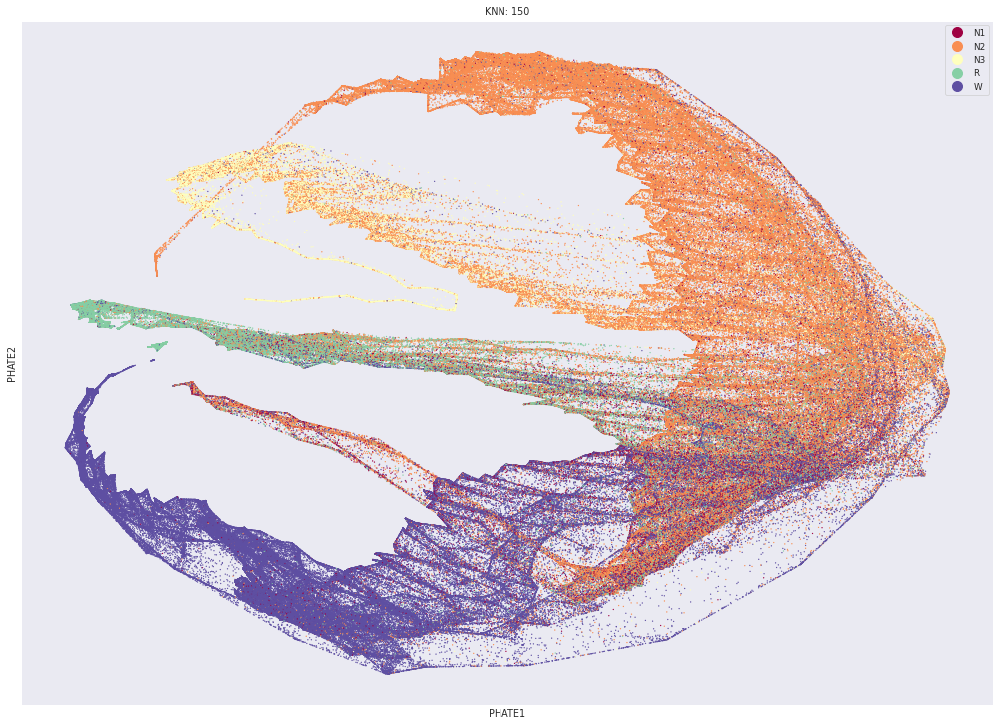

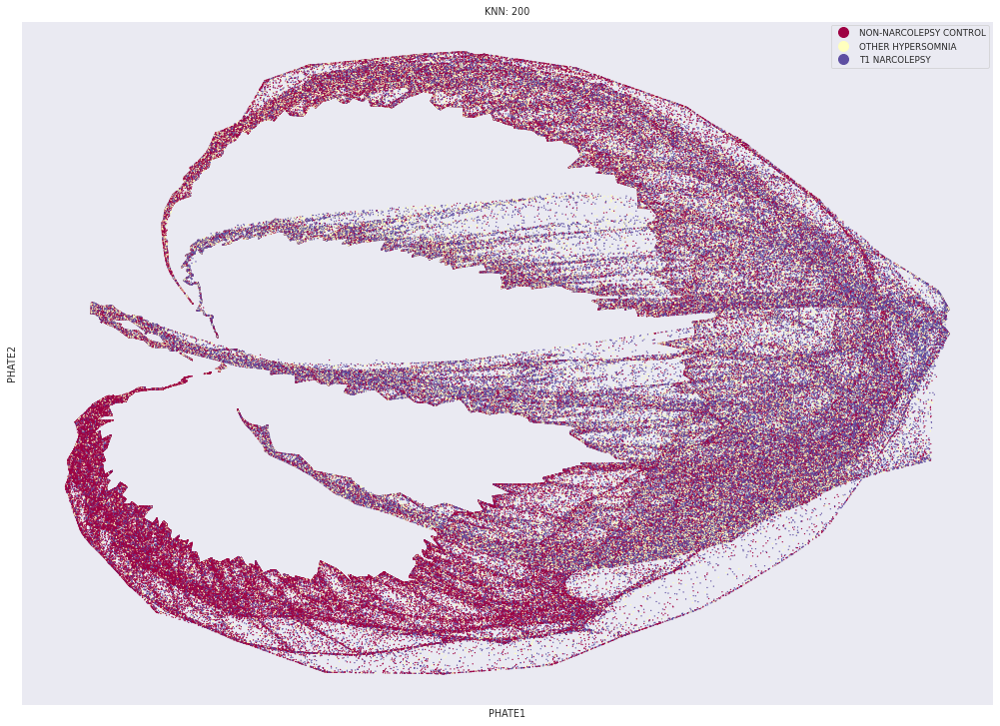

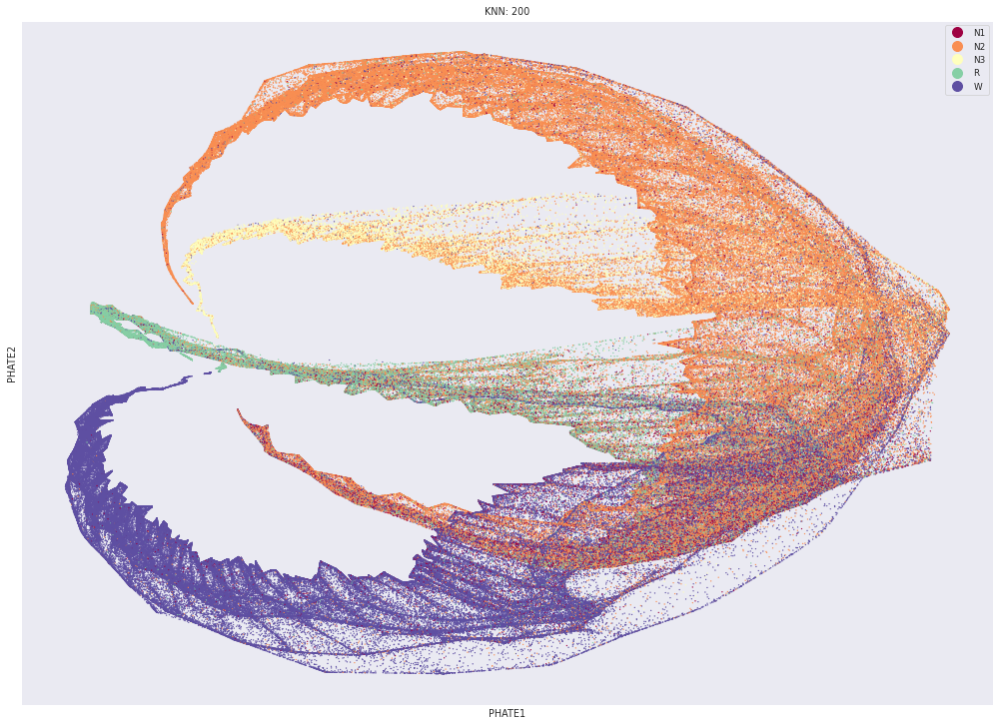

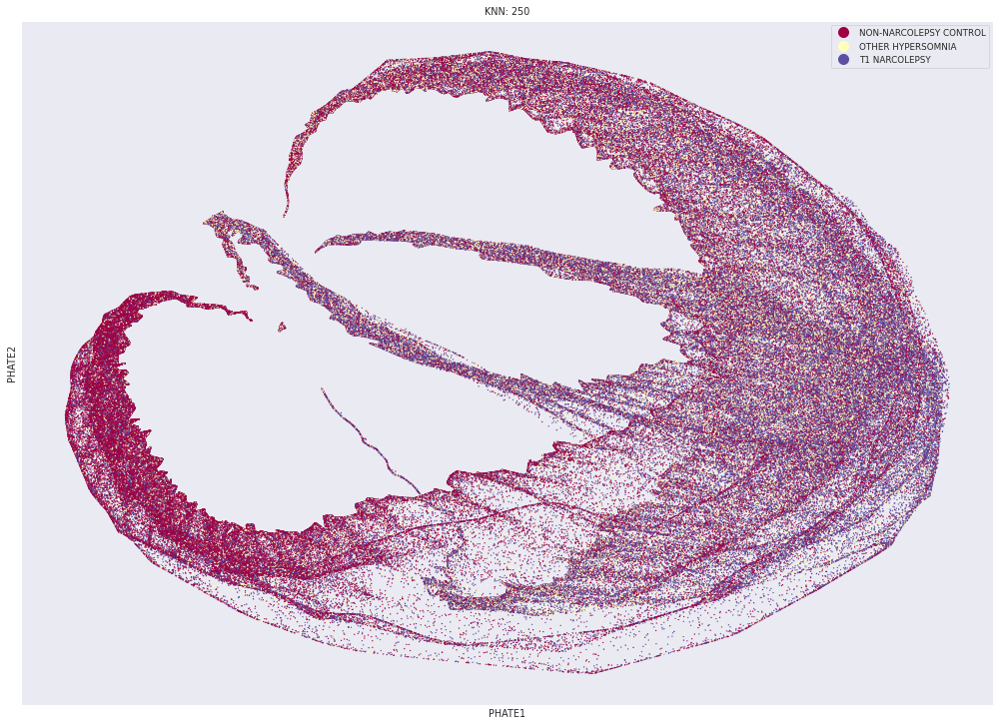

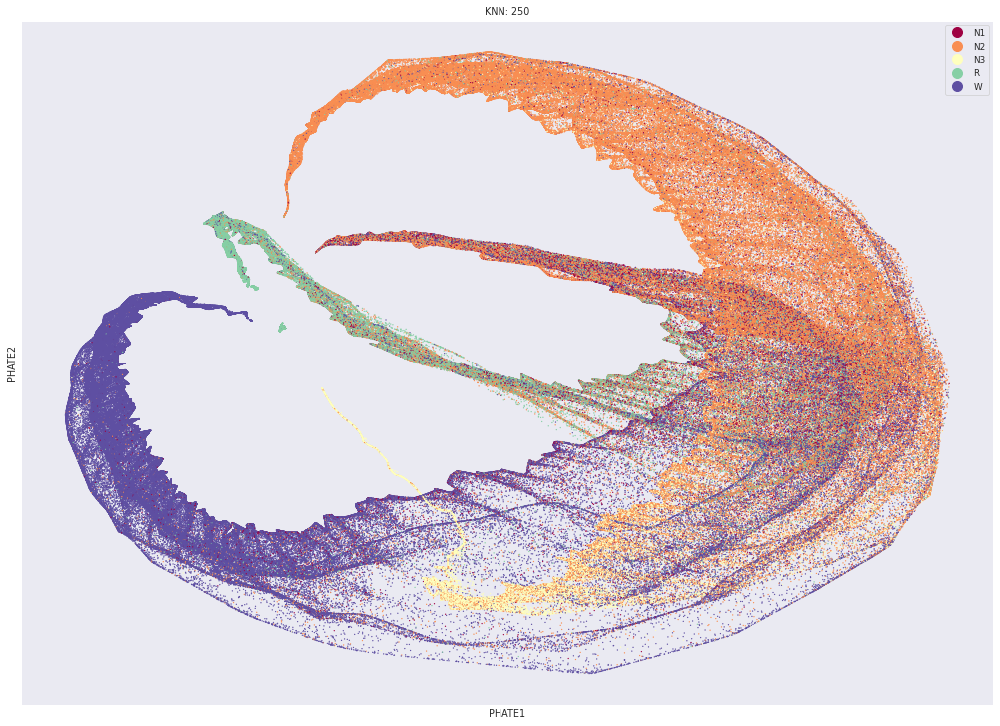

In [6]:
X = []
y = []
l = []
d = []
for idx, selected_record in selected_top10.iterrows():
    fileid = selected_record['FileID']
    diagnosis = selected_record['Diagnosis'].replace("'", "")
    record = predictions[fileid]
    logits = record['logidts']
    target = record['true'].argmax(axis=1).repeat(30)
    labels = np.array([HYP_DICT[t] for t in target])
    labels_disease = [diagnosis for _ in range(len(target))]
    
    X.append(logits)
    y.append(target)
    l.append(labels)
    d.extend(labels_disease)
    
X = np.concatenate(X, axis=0)
y = np.concatenate(y, axis=0)
l = np.concatenate(l, axis=0)
# X = np.asarray(X)
# y = np.array(y)
# l = np.array(l)
for n_knn in [5, 15, 25, 50, 100, 150, 200, 250]:
    phate_op = phate.PHATE(n_jobs=-1, random_state=1337, knn=n_knn)
    y_phate = phate_op.fit_transform(X)
    title = f"KNN: {n_knn}"
    scprep.plot.scatter2d(y_phate, c=d, cmap='Spectral', ticks=False, label_prefix='PHATE')
    plt.title(title)
    plt.savefig(f"results/phate/phate_narco_{fileid.split('.')[0]}_knn{n_knn:03}_disorder.png", dpi=300, bbox_inches='tight', pad_inches=0)
    scprep.plot.scatter2d(y_phate, c=l, cmap='Spectral', ticks=False, label_prefix='PHATE')
    plt.title(title)
    plt.savefig(f"results/phate/phate_narco_{fileid.split('.')[0]}_knn{n_knn:03}_stages.png", dpi=300, bbox_inches='tight', pad_inches=0)

Calculating PHATE...
  Running PHATE on 29700 observations and 5 variables.
  Calculating graph and diffusion operator...
    Calculating KNN search...
    Calculated KNN search in 2.37 seconds.
    Calculating affinities...


/home/groups/mignot/miniconda3/envs/pt1.7/lib/python3.7/site-packages/graphtools/graphs.py:293: RuntimeWarning: Detected zero distance between 516 pairs of samples. Consider removing duplicates to avoid errors in downstream processing.
  RuntimeWarning,


    Calculated affinities in 0.65 seconds.
  Calculated graph and diffusion operator in 3.10 seconds.
  Calculating landmark operator...
    Calculating SVD...
    Calculated SVD in 2.85 seconds.
    Calculating KMeans...
    Calculated KMeans in 15.80 seconds.
  Calculated landmark operator in 20.38 seconds.
  Calculating optimal t...
    Automatically selected t = 51
  Calculated optimal t in 1.43 seconds.
  Calculating diffusion potential...
  Calculated diffusion potential in 0.61 seconds.
  Calculating metric MDS...
  Calculated metric MDS in 5.62 seconds.
Calculated PHATE in 31.16 seconds.
Calculating metric MDS...
Calculated metric MDS in 57.42 seconds.


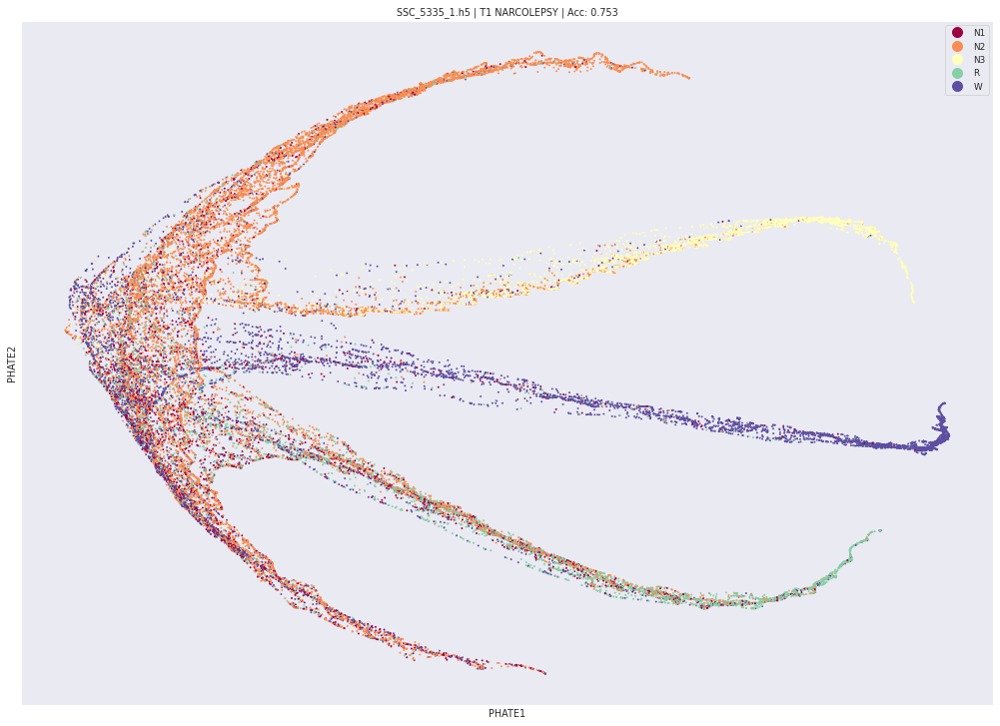

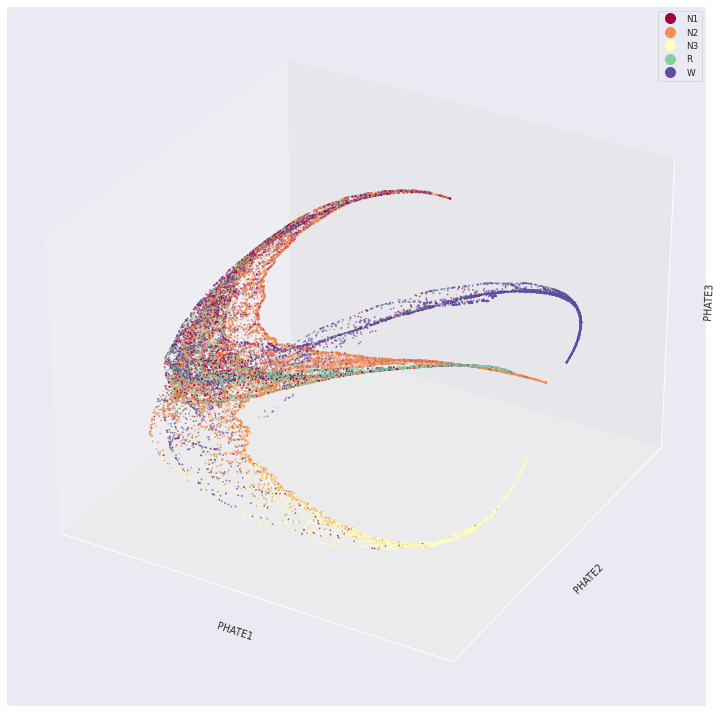

In [42]:
for idx, selected_record in df_preds.query('Label == 1').iterrows():
    fileid = selected_record['FileID']
    if fileid == 'SSC_5335_1.h5':
        pass
    else:
        continue
    diagnosis = selected_record['Diagnosis'].replace("'", "")
    acc = selected_record['Accuracy']
    record = predictions[fileid]
    logits = record['logits']
    target = record['true'].argmax(1).repeat(30)
    labels = np.array([HYP_DICT[t] for t in target])
    labels_halfhour = np.arange(len(labels) / (30 * 60)).repeat(30 * 60)[:len(labels)]
    phate_op = phate.PHATE(n_jobs=-2, random_state=1337, knn=20)
    Y_phate = phate_op.fit_transform(logits)
#     umap.plot.points(mapper, labels=labels, theme='fire')
    scprep.plot.scatter2d(Y_phate, c=labels, cmap='Spectral', ticks=False, label_prefix="PHATE")
    title = (f"{fileid} | " +
             f"{diagnosis} | " +
             f"Acc: {acc:.3f}")
    plt.title(title)
    phate_op.set_params(n_components=3)
    Y_phate_3d = phate_op.transform()
    scprep.plot.scatter3d(Y_phate_3d, c=labels, cmap='Spectral', ticks=False, label_prefix='PHATE')
#     plt.savefig(f"results/umap/narco_{fileid.split('.')[0]}.png", dpi=300, bbox_inches='tight', pad_inches=0)

In [49]:
labels_1s = np.arange(len(labels)) / (len(labels) * 8)